In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 54.9 MB/s eta 0:00:00


In [ ]:
import ultralytics
from ultralytics import YOLO

# Check the version
print(ultralytics.__version__)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
8.3.40


In [ ]:
!pip install -U albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.9/227.9 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 48.0 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

# Path to the labels folder (update this to your actual path)
labels_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/labels'

# Function to check label format
def validate_label_file(file_path):
    with open(file_path, 'r') as f:
        lines = f.readlines()
        for line_num, line in enumerate(lines, start=1):
            parts = line.strip().split()
            if len(parts) != 5:
                print(f"Incorrect format in {file_path}, line {line_num}: {line.strip()}")
                return False
            try:
                class_id = int(parts[0])  # Class ID must be an integer
                bbox = [float(x) for x in parts[1:]]  # Rest must be floats
                if not all(0 <= x <= 1 for x in bbox):  # Ensure bbox values are normalized
                    print(f"Out-of-range values in {file_path}, line {line_num}: {line.strip()}")
                    return False
            except ValueError:
                print(f"Non-numeric value in {file_path}, line {line_num}: {line.strip()}")
                return False
    return True

# Loop through all label files
for file_name in os.listdir(labels_folder):
    if file_name.endswith('.txt'):  # Ensure it's a label file
        file_path = os.path.join(labels_folder, file_name)
        if validate_label_file(file_path):
            print(f"File {file_name} is valid.")
        else:
            print(f"File {file_name} has errors.")


File frame_0087_jpg.rf.6911e25ecb00139750616b606571e714.txt is valid.
File frame_0435_jpg.rf.b64a627a937f4b21417074ddc983c184.txt is valid.
File frame_0435_jpg.rf.2e3980e2d44f690fca901bbe71981b7a.txt is valid.
File frame_0002_jpg.rf.a929cd43bfa0953ace4ea9ea00fa9ba7.txt is valid.
File frame_0182_jpg.rf.24ccc1dc2e78b06ec38094471560e981.txt is valid.
File frame_1001_jpg.rf.d499e6c10b2608d56531ba7694c588ab.txt is valid.
File frame_0654_jpg.rf.a078b9fb055bd8aabc4ea0269670ec31.txt is valid.
File frame_0786_jpg.rf.815a596695f2267e033ce6394667c19d.txt is valid.
File frame_0725_jpg.rf.47dda94b1ae3d1c9dac287942b0dba0f.txt is valid.
File frame_0691_jpg.rf.5ccee83c900423ebc9201d81db329e7e.txt is valid.
File frame_0786_jpg.rf.9c16f9a4a00bb016a85338355e44073d.txt is valid.
File frame_1003_jpg.rf.9875f8650b93b769ff544d849f453b7c.txt is valid.
File frame_1005_jpg.rf.72eca626ce1bf4c1e541ab4a6409f6a9.txt is valid.
File frame_1006_jpg.rf.1b9373a850a38c393fedb566b102513c.txt is valid.
File frame_1008_jpg.

Total Instances (All Images Combined):
Truck: 64
Car: 2023
Motorcycle: 355
Pickup: 251
Bus: 31

Number of Images Containing Each Class:
Car: 123
Truck: 46
Motorcycle: 74
Pickup: 91
Bus: 28


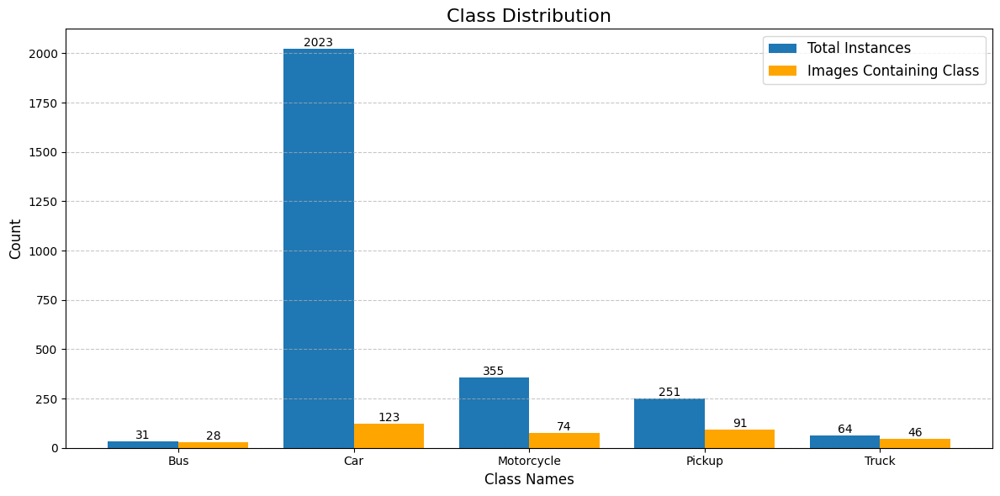

In [ ]:
import os
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np

# Path to the labels folder
labels_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/labels'

# Initialize counters
class_instance_counts = Counter()  # Total instances of each class
class_image_counts = Counter()    # Number of images containing at least one instance of each class

# Loop through all label files
for file_name in os.listdir(labels_folder):
    if file_name.endswith('.txt'):  # Ensure it's a label file
        file_path = os.path.join(labels_folder, file_name)
        image_classes = set()  # Track unique classes in this image
        with open(file_path, 'r') as f:
            for line in f:
                class_id = int(line.split()[0])  # Extract the class ID (first column)
                class_instance_counts[class_id] += 1  # Count total instances
                image_classes.add(class_id)  # Add to set of classes in this image
        # Update class_image_counts for this image
        for class_id in image_classes:
            class_image_counts[class_id] += 1

# Map class IDs to class names (from the YAML file)
class_names = ['Bus', 'Car', 'Motorcycle', 'Pickup', 'Truck']
class_instance_counts_named = {class_names[class_id]: count for class_id, count in class_instance_counts.items()}
class_image_counts_named = {class_names[class_id]: count for class_id, count in class_image_counts.items()}

# Print the counts for each class
print("Total Instances (All Images Combined):")
for class_name, count in class_instance_counts_named.items():
    print(f"{class_name}: {count}")

print("\nNumber of Images Containing Each Class:")
for class_name, count in class_image_counts_named.items():
    print(f"{class_name}: {count}")

# Prepare data for visualization
x = np.arange(len(class_names))  # X-axis positions
width = 0.4  # Width of bars

# Plot side-by-side bar charts
plt.figure(figsize=(12, 6))
bars1 = plt.bar(x - width/2, [class_instance_counts[class_id] for class_id in range(len(class_names))],
                width=width, label='Total Instances')
bars2 = plt.bar(x + width/2, [class_image_counts[class_id] for class_id in range(len(class_names))],
                width=width, color='orange', label='Images Containing Class')

# Add titles and labels
plt.title("Class Distribution", fontsize=16)
plt.xlabel("Class Names", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(x, class_names, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(fontsize=12)

# Add value labels on top of bars
for bar in bars1:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(bar.get_height()),
             ha='center', va='bottom', fontsize=10)
for bar in bars2:
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(bar.get_height()),
             ha='center', va='bottom', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
model = YOLO('yolov9t.pt')

results = model.train(
    data='/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data.yaml',
    epochs=200,
    batch=32,
    verbose=True,
    patience=10
)

100%|██████████| 4.74M/4.74M [00:00<00:00, 80.9MB/s]


Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov9t.pt, data=/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data.yaml, epochs=200, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False,

100%|██████████| 755k/755k [00:00<00:00, 25.7MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7872  ultralytics.nn.modules.block.ELAN1           [32, 32, 32, 16]              
  3                  -1  1     18560  ultralytics.nn.modules.block.AConv           [32, 64]                      
  4                  -1  1     65216  ultralytics.nn.modules.block.RepNCSPELAN4    [64, 64, 64, 32, 3]           
  5                  -1  1     55488  ultralytics.nn.modules.block.AConv           [64, 96]                      
  6                  -1  1    145824  ultralytics.nn.modules.block.RepNCSPELAN4    [96, 96, 96, 48, 3]           
  7                  -1  1    110848  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 98.7MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/labels.cache... 136 images, 2 backgrounds, 0 corrupt: 100%|██████████| 136/136 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/valid/labels.cache... 28 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28/28 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 221 weight(decay=0.0), 228 weight(decay=0.0005), 227 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      6.53G       1.48      4.261      1.113        270        640: 100%|██████████| 5/5 [00:03<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.52s/it]

                   all         28        563    0.00147      0.124      0.011    0.00388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      6.35G      1.417      3.996      1.039        173        640: 100%|██████████| 5/5 [00:01<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

                   all         28        563    0.00705      0.231     0.0637     0.0223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      6.61G      1.395       3.31     0.9643        230        640: 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]

                   all         28        563     0.0114      0.273     0.0685     0.0261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      6.49G      1.452      2.296     0.9618        210        640: 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         28        563     0.0207      0.335      0.128     0.0601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      6.66G      1.368      1.854     0.9546        186        640: 100%|██████████| 5/5 [00:01<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


                   all         28        563      0.946     0.0516      0.153      0.091

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      6.48G      1.326      1.603     0.9467        228        640: 100%|██████████| 5/5 [00:01<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.867      0.107      0.181     0.0952



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      6.29G      1.285      1.478     0.9694        118        640: 100%|██████████| 5/5 [00:01<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]

                   all         28        563     0.0423      0.508      0.258      0.155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200       6.3G      1.306      1.408     0.9727        112        640: 100%|██████████| 5/5 [00:01<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]

                   all         28        563     0.0447      0.511      0.316      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      6.92G      1.241      1.318     0.9437        333        640: 100%|██████████| 5/5 [00:01<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


                   all         28        563     0.0466      0.524      0.356      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      6.02G      1.192      1.213     0.9295        205        640: 100%|██████████| 5/5 [00:01<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


                   all         28        563     0.0509      0.571      0.322      0.183

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      6.36G      1.234      1.213     0.9525        110        640: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


                   all         28        563     0.0535      0.572      0.338        0.2

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      6.49G      1.202      1.141     0.9241        275        640: 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all         28        563      0.755      0.267      0.363      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      6.08G      1.189      1.104     0.9268        318        640: 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

                   all         28        563      0.639      0.327      0.361      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      6.55G      1.171      1.069     0.9279        250        640: 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         28        563      0.903      0.152      0.399      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      6.88G      1.186      1.107     0.9246        283        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         28        563      0.894      0.158      0.448      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      6.29G      1.131     0.9879     0.9122        197        640: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


                   all         28        563      0.737      0.226       0.53      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200       6.5G      1.133       1.03     0.9234        121        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


                   all         28        563      0.791      0.286       0.53       0.33

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      6.93G       1.12      1.001     0.9218        180        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

                   all         28        563       0.74      0.289       0.51      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      6.25G      1.108     0.9676     0.9207        146        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563      0.865      0.271      0.545      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      6.59G      1.118     0.9763     0.9266        138        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


                   all         28        563      0.902      0.153      0.586      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      6.57G      1.129      1.028     0.9172        195        640: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


                   all         28        563      0.623      0.329      0.497      0.306

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      6.62G      1.102      0.924     0.9036        318        640: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


                   all         28        563      0.612      0.488      0.513      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      6.51G      1.085     0.9269     0.9147        136        640: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


                   all         28        563      0.633      0.505      0.534      0.344

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      6.81G      1.127     0.9157      0.922        156        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.769      0.444      0.538      0.346



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      6.59G      1.134     0.9533     0.9306        138        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


                   all         28        563      0.589      0.443      0.558       0.34

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      6.49G      1.108     0.8799     0.9224        180        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         28        563      0.635      0.545      0.612      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      6.36G      1.093     0.8824     0.9172        204        640: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


                   all         28        563      0.673      0.533      0.589      0.371

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      6.56G      1.062     0.8699     0.9117        162        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

                   all         28        563      0.624      0.588      0.574      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      6.97G      1.045     0.8292     0.9127        219        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


                   all         28        563      0.716      0.595      0.602      0.392

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200       6.7G      1.091      0.819     0.9083        281        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


                   all         28        563      0.644       0.62      0.595      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      6.31G      1.067     0.8188     0.9119        149        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

                   all         28        563      0.678      0.618      0.623       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200       6.7G      1.072     0.8475     0.8914        318        640: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]

                   all         28        563      0.669      0.587      0.574      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      7.01G      1.086     0.8198     0.9097        223        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

                   all         28        563      0.709      0.654      0.612      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      6.79G      1.051     0.8042     0.9167        178        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


                   all         28        563       0.73       0.64      0.636      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      6.36G      1.034     0.7903     0.8954        222        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]

                   all         28        563      0.657      0.652      0.625      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      6.49G      1.052     0.8247     0.9049        285        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


                   all         28        563      0.792      0.638      0.664      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      6.78G      1.068     0.8104     0.9079        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


                   all         28        563      0.703      0.637      0.644      0.404

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      6.29G      1.018     0.8284     0.9022        147        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all         28        563      0.732      0.531      0.646      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      6.76G      1.021     0.7791      0.888        214        640: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

                   all         28        563      0.657      0.611      0.665      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      6.54G     0.9798     0.7682     0.9041        199        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all         28        563      0.624      0.716      0.654      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      6.89G      1.006      0.788      0.898        263        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]

                   all         28        563      0.678      0.668      0.657      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      6.66G      1.017     0.7885     0.8981        163        640: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]

                   all         28        563      0.904      0.504      0.691      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      6.92G      1.031      0.781     0.8898        230        640: 100%|██████████| 5/5 [00:01<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


                   all         28        563      0.681      0.669      0.668      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      7.06G      1.032     0.7455      0.911        264        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         28        563       0.73      0.633      0.676      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      6.54G      1.053      0.776     0.9063        249        640: 100%|██████████| 5/5 [00:01<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


                   all         28        563      0.767       0.63      0.665      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      6.44G      1.051     0.7579     0.8985        172        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

                   all         28        563      0.735      0.635      0.678      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      7.48G      1.032     0.7663     0.9035        219        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]

                   all         28        563      0.751      0.674      0.718      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      6.87G      1.051     0.7239     0.8994        235        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]

                   all         28        563      0.794       0.67      0.706      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      6.74G     0.9889     0.7556     0.8889        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

                   all         28        563      0.787      0.645      0.712      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      6.83G     0.9926     0.7306     0.8909        265        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all         28        563      0.743      0.667      0.705      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      6.46G     0.9859     0.7065     0.8927        234        640: 100%|██████████| 5/5 [00:01<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         28        563      0.814      0.693       0.71       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      7.31G     0.9555     0.7502     0.8928         75        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563       0.74      0.617      0.684      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      6.55G      0.995     0.7191     0.9037        264        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]

                   all         28        563      0.671      0.614       0.65      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200       6.7G     0.9634     0.7075     0.8881        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all         28        563      0.668      0.618      0.616      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      6.51G     0.9411     0.6975     0.8859        124        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

                   all         28        563      0.778       0.57      0.635      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      6.87G      0.973     0.7043      0.897        218        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

                   all         28        563      0.706       0.65      0.704      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      6.78G     0.9565     0.7433     0.8997        112        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


                   all         28        563      0.722      0.714      0.713      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      6.31G     0.9879     0.7049     0.8973        342        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         28        563      0.784      0.655      0.717       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      6.51G     0.9807     0.6871     0.9002        149        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]

                   all         28        563      0.784      0.599      0.672      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      6.49G     0.9524     0.6839     0.8937        253        640: 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         28        563      0.717      0.663      0.704      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      6.53G     0.9974     0.6812     0.8967        344        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]

                   all         28        563      0.751       0.64      0.712      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      6.38G     0.9517     0.6582     0.8811        197        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         28        563      0.733      0.699      0.707      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      6.23G     0.9466     0.6635     0.8922        207        640: 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

                   all         28        563       0.76       0.69       0.72      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      6.69G     0.9548     0.6818     0.8823        157        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

                   all         28        563      0.746      0.635      0.699      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      6.87G     0.9177     0.6395      0.893        257        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         28        563      0.737      0.673      0.705       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      6.33G     0.9337     0.6508     0.8927        135        640: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]

                   all         28        563      0.755      0.677      0.672      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      6.43G     0.9296     0.6435     0.8729        269        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all         28        563       0.72      0.691      0.679      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      7.12G     0.9183     0.6298     0.8652        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]

                   all         28        563      0.733      0.683      0.704      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      6.05G     0.9357     0.6333     0.8901        115        640: 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]

                   all         28        563      0.805      0.575      0.637      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      6.47G     0.8857     0.6514     0.8905         79        640: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]

                   all         28        563      0.773      0.673      0.705      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      7.16G     0.9471     0.6553     0.8833        315        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

                   all         28        563      0.762      0.722      0.745      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      6.27G      0.961      0.645     0.8784        316        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]

                   all         28        563      0.797      0.713      0.759      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      7.14G     0.9326     0.6255     0.8766        299        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

                   all         28        563      0.786      0.725      0.759       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      6.33G     0.9064     0.6271     0.8783        213        640: 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

                   all         28        563      0.741      0.699      0.762       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      6.62G     0.9911     0.6802     0.8893        222        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.842      0.633      0.729      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      6.79G     0.9381     0.6452     0.8847        180        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

                   all         28        563      0.824      0.618      0.712      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      6.28G     0.9135     0.6128     0.8786        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]

                   all         28        563      0.716      0.675      0.738      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      6.39G     0.8861     0.6367     0.8673        156        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


                   all         28        563      0.735      0.663      0.732      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      6.26G     0.9436     0.6174     0.8765        244        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]

                   all         28        563      0.734      0.663      0.722      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      7.08G     0.8964     0.6296     0.8777        302        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]

                   all         28        563      0.769      0.665      0.722      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      6.46G     0.8986     0.6057     0.8775        167        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

                   all         28        563      0.733      0.695      0.737      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      6.51G     0.9028     0.5967      0.874        253        640: 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]

                   all         28        563       0.76       0.73      0.752      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200       6.9G     0.9002     0.6122     0.8729        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

                   all         28        563      0.725      0.726       0.73      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200       6.4G     0.9418       0.62      0.879        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all         28        563      0.725      0.741      0.719      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      6.98G     0.9123      0.621     0.8782        148        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]

                   all         28        563      0.761       0.72      0.728      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      6.33G     0.8781     0.5927     0.8667        182        640: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]

                   all         28        563       0.72       0.71      0.725      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      6.23G     0.8788     0.5805     0.8757        179        640: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]

                   all         28        563      0.834      0.681       0.75      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      6.23G     0.9029     0.6052     0.8763        158        640: 100%|██████████| 5/5 [00:01<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all         28        563      0.765      0.729      0.756      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200       6.4G     0.9339     0.6359     0.8782        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         28        563      0.777      0.709      0.779      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      6.27G       0.93     0.6578     0.8761        117        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


                   all         28        563      0.787       0.69      0.734      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      6.89G     0.8981     0.5969     0.8764        221        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         28        563      0.828       0.71      0.736      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      6.65G      0.885     0.5962     0.8799        175        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

                   all         28        563       0.79      0.702      0.738      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      6.72G     0.9035     0.5954     0.8742        273        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all         28        563      0.758      0.709       0.74      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      6.33G     0.9067     0.5919      0.877        306        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all         28        563      0.743      0.723      0.732      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      6.16G     0.9402     0.6161     0.8749        324        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]

                   all         28        563      0.782       0.67      0.738       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      6.47G     0.8861     0.6303     0.8841        114        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.811      0.652      0.757      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      6.81G     0.9271     0.6276     0.8719        291        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all         28        563      0.772      0.722      0.763      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      6.48G      0.903     0.6049     0.8745        339        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]

                   all         28        563      0.834      0.723      0.761      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      6.68G     0.8876     0.5936      0.872        301        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         28        563      0.759       0.73      0.737      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      6.85G     0.8794     0.5833     0.8656        292        640: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]

                   all         28        563      0.764       0.75      0.754      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      6.66G     0.8728     0.5957     0.8748         86        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


                   all         28        563      0.777      0.736      0.743      0.483

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      6.55G     0.9211     0.5918     0.8679        247        640: 100%|██████████| 5/5 [00:01<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]

                   all         28        563      0.753       0.73      0.729      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      6.91G     0.9124     0.5949     0.8714        287        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

                   all         28        563        0.8      0.688      0.731       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      6.58G     0.8584     0.5792     0.8717        132        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

                   all         28        563      0.739      0.676      0.726      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      6.83G     0.8566     0.5767     0.8578        165        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]

                   all         28        563      0.738      0.752      0.751      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      6.62G     0.8553     0.5462     0.8562        252        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


                   all         28        563      0.823      0.743      0.752      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      6.43G     0.8604     0.5718     0.8644        176        640: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]

                   all         28        563      0.801      0.742       0.75      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      7.12G     0.8871     0.5618     0.8671        266        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

                   all         28        563      0.777      0.707      0.756       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      6.57G       0.87     0.5696     0.8627        317        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

                   all         28        563      0.754      0.711      0.749      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      6.65G      0.853     0.5512     0.8657        207        640: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]

                   all         28        563      0.797      0.655       0.73      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      6.62G     0.8693     0.5734     0.8702        279        640: 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]

                   all         28        563      0.749      0.707      0.747      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      6.35G     0.8558     0.5607     0.8612        243        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]

                   all         28        563      0.844      0.663      0.745      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      6.84G     0.8613     0.5864     0.8735         97        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]

                   all         28        563      0.823      0.712       0.76      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      6.74G     0.8502     0.5492     0.8612        232        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         28        563      0.766      0.726      0.744      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      6.84G     0.8634     0.5484     0.8551        205        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]

                   all         28        563      0.808        0.7      0.743      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      6.22G     0.8553     0.5431     0.8628        119        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]

                   all         28        563      0.769      0.737      0.744      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      6.47G     0.8614     0.5702     0.8764         91        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

                   all         28        563      0.722      0.769      0.754      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      6.72G     0.8659     0.5384     0.8644        184        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.93it/s]

                   all         28        563      0.743      0.755      0.761      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200       6.5G     0.9174     0.5819     0.8749        168        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         28        563      0.751      0.747      0.753      0.498

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      6.56G     0.8639     0.5417     0.8706        310        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

                   all         28        563      0.719      0.761      0.726      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      6.01G     0.8519      0.542     0.8676        157        640: 100%|██████████| 5/5 [00:01<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]

                   all         28        563      0.752      0.756      0.722      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      6.65G      0.828     0.5496     0.8537        197        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.63it/s]

                   all         28        563      0.753      0.738      0.715      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      6.56G     0.8274     0.5447      0.865        199        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

                   all         28        563      0.747      0.733      0.753       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      6.55G     0.8076     0.5106     0.8616        164        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all         28        563      0.778      0.737      0.748      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      6.98G      0.867      0.545     0.8571        318        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


                   all         28        563      0.804      0.713      0.742      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      6.37G     0.8337     0.5527     0.8664        136        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         28        563      0.781      0.742      0.743      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      6.71G     0.8882     0.5438     0.8754        148        640: 100%|██████████| 5/5 [00:01<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

                   all         28        563      0.783      0.748      0.767      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      6.42G     0.8437     0.5385     0.8584        149        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]

                   all         28        563      0.756       0.74      0.759      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      6.53G     0.8105     0.5149     0.8546        169        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]

                   all         28        563      0.721      0.765      0.749       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      6.17G     0.8291     0.5207     0.8609        241        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all         28        563      0.728      0.748      0.752      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200       6.3G     0.8556     0.5361     0.8624        329        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

                   all         28        563      0.764      0.747      0.759      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      7.09G     0.8738     0.5535      0.865        208        640: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

                   all         28        563      0.793      0.712      0.749      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      7.05G     0.8604     0.5376     0.8663        322        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all         28        563      0.789      0.715      0.743      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      6.76G     0.8397     0.5297     0.8669        168        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

                   all         28        563      0.787      0.732      0.748      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      6.41G     0.8219     0.5078     0.8602        277        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

                   all         28        563      0.746      0.748      0.741      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200       6.7G     0.8446     0.5315     0.8602        301        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]

                   all         28        563      0.767      0.735      0.756       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      6.48G     0.8286     0.5165     0.8608        169        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]

                   all         28        563      0.771      0.753      0.753       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      6.09G     0.8362     0.5166     0.8557        119        640: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         28        563      0.797      0.707      0.757      0.525

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      6.93G     0.8222     0.5087     0.8565        240        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]

                   all         28        563      0.779      0.714      0.749      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      7.12G     0.8482     0.5235     0.8563        203        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

                   all         28        563      0.771      0.751      0.758      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      6.72G     0.8446     0.5413     0.8706        327        640: 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         28        563       0.77      0.737      0.753      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200       6.4G     0.8366     0.5275      0.863        195        640: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


                   all         28        563      0.782      0.736      0.756      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      6.45G     0.7799     0.4981     0.8607        200        640: 100%|██████████| 5/5 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]

                   all         28        563      0.792      0.729      0.766      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      6.19G     0.8159     0.5245     0.8594        238        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]

                   all         28        563       0.79       0.74      0.767      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      6.27G     0.7677     0.4804     0.8459        142        640: 100%|██████████| 5/5 [00:01<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.82it/s]

                   all         28        563       0.85      0.712      0.765      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      6.47G     0.8111     0.5015      0.853        363        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]

                   all         28        563      0.814      0.725      0.757      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      6.46G     0.8036     0.5173     0.8536        150        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

                   all         28        563      0.778      0.747      0.755      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      6.44G     0.8208     0.5189     0.8568        247        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

                   all         28        563       0.76      0.746      0.752       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      6.76G       0.81     0.5091     0.8556        183        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.12it/s]

                   all         28        563      0.795       0.73      0.744      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      6.52G      0.779     0.5085     0.8586        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]

                   all         28        563      0.784      0.738      0.756       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      6.43G     0.7845     0.5046     0.8558        297        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


                   all         28        563      0.786      0.741       0.75      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      6.21G     0.8236     0.5257     0.8522        409        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all         28        563      0.795      0.705      0.756      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      6.77G     0.7822     0.4979     0.8546        153        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]

                   all         28        563      0.798      0.745      0.756       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200       6.1G     0.7533     0.4882     0.8474        201        640: 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]

                   all         28        563      0.773      0.736      0.759      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      6.19G     0.7983     0.5116     0.8549        197        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]

                   all         28        563      0.762      0.745      0.756      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200       7.1G     0.7931      0.494     0.8455        247        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]

                   all         28        563      0.749      0.747      0.753      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      6.32G     0.7841     0.5146     0.8499        154        640: 100%|██████████| 5/5 [00:01<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]

                   all         28        563      0.741      0.752       0.76      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      6.19G     0.7877     0.5101      0.861        180        640: 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]

                   all         28        563      0.767      0.754      0.759      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      6.22G     0.7815     0.5026     0.8453        386        640: 100%|██████████| 5/5 [00:01<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all         28        563      0.771      0.755       0.76      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      7.06G     0.7784     0.5056      0.856        196        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         28        563      0.789      0.752      0.764      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      6.57G     0.7604     0.4839     0.8461        221        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]

                   all         28        563      0.796      0.716      0.763      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      6.39G     0.7653     0.4905     0.8438        175        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.02it/s]

                   all         28        563      0.773      0.743      0.767      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      6.36G     0.7514     0.4722     0.8465        253        640: 100%|██████████| 5/5 [00:01<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

                   all         28        563      0.773      0.736      0.766      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      6.52G     0.8089     0.5088     0.8547        209        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]

                   all         28        563      0.766      0.759      0.771      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200         7G     0.7858     0.4838     0.8497        120        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]

                   all         28        563      0.819      0.726      0.778      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      6.84G     0.7547     0.4774     0.8534        179        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


                   all         28        563      0.807      0.736      0.781      0.521

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      6.51G     0.7675     0.4822     0.8533        221        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

                   all         28        563      0.817      0.721      0.786       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      6.39G     0.7527     0.4752     0.8441        163        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]

                   all         28        563      0.818      0.751      0.788      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      6.44G     0.7369     0.4719     0.8493        168        640: 100%|██████████| 5/5 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


                   all         28        563      0.827      0.746       0.78       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      6.14G     0.7717     0.4821     0.8463        255        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

                   all         28        563      0.822      0.739      0.799      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200       6.6G     0.7561     0.4743     0.8605        147        640: 100%|██████████| 5/5 [00:01<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all         28        563      0.812      0.742      0.779      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      6.55G     0.7614     0.4848     0.8438        203        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.86it/s]

                   all         28        563      0.815      0.737       0.78      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      6.47G     0.7808     0.4864     0.8426        267        640: 100%|██████████| 5/5 [00:01<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]

                   all         28        563      0.876      0.725      0.779      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200      6.51G     0.7663     0.4721     0.8476        231        640: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


                   all         28        563       0.82      0.755      0.773      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      6.64G     0.7814     0.5091     0.8553        201        640: 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


                   all         28        563      0.816      0.743      0.791      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      7.02G     0.7612     0.4772     0.8427        131        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]

                   all         28        563      0.771      0.759      0.762      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      7.08G     0.7787     0.4848     0.8554        120        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]

                   all         28        563       0.73      0.763      0.753      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      6.87G       0.77      0.474     0.8443        235        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

                   all         28        563      0.767      0.757      0.752      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      6.55G     0.7503      0.473     0.8502        140        640: 100%|██████████| 5/5 [00:01<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]

                   all         28        563       0.78      0.753      0.756      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      6.39G     0.7632     0.4736     0.8468        175        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]

                   all         28        563      0.793      0.751      0.773      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      7.13G     0.7473     0.4587     0.8364        256        640: 100%|██████████| 5/5 [00:01<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]

                   all         28        563      0.797      0.748      0.775       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      6.89G     0.7621     0.4721     0.8446        303        640: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]

                   all         28        563      0.805      0.746      0.776      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      6.53G     0.7822     0.4908     0.8516        313        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]

                   all         28        563      0.799      0.749      0.768       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      6.38G     0.7711     0.4692      0.845        157        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

                   all         28        563      0.794      0.747      0.768      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      6.21G      0.732     0.4564     0.8444        221        640: 100%|██████████| 5/5 [00:01<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]

                   all         28        563      0.797      0.751      0.767      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      7.42G     0.7213      0.456     0.8423        199        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]

                   all         28        563      0.773      0.754      0.766      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      7.35G     0.7205     0.4586     0.8394         83        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

                   all         28        563       0.77       0.76      0.768      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      6.48G     0.7379      0.462     0.8578        187        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

                   all         28        563      0.766      0.758      0.769      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      6.51G     0.7348     0.4577      0.843        151        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]

                   all         28        563       0.77      0.757      0.769      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      6.18G     0.7445     0.4761     0.8434        188        640: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]

                   all         28        563      0.762      0.756      0.769      0.536


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      6.13G     0.7415     0.4599      0.843        123        640: 100%|██████████| 5/5 [00:03<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

                   all         28        563      0.758      0.753      0.772      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      6.29G     0.7243     0.4459     0.8296        131        640: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


                   all         28        563      0.751      0.758      0.768      0.534

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200       5.9G     0.7112     0.4309     0.8343        143        640: 100%|██████████| 5/5 [00:01<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.28it/s]


                   all         28        563      0.748      0.763      0.769      0.536

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      5.84G     0.7287     0.4663     0.8399        149        640: 100%|██████████| 5/5 [00:01<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

                   all         28        563      0.759      0.762       0.77      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200       5.7G     0.7304     0.4536     0.8342        101        640: 100%|██████████| 5/5 [00:01<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]

                   all         28        563      0.769      0.762      0.767      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      5.78G     0.7213     0.4443     0.8469        184        640: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


                   all         28        563       0.76      0.759      0.768      0.538

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      5.72G     0.6984       0.43     0.8355        122        640: 100%|██████████| 5/5 [00:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

                   all         28        563      0.766      0.754      0.768       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200       5.9G      0.721     0.4356     0.8328        160        640: 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]

                   all         28        563      0.769      0.751       0.77      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      5.96G     0.7076     0.4527     0.8349         94        640: 100%|██████████| 5/5 [00:01<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]

                   all         28        563      0.771      0.749      0.771       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      5.73G     0.7236     0.4325     0.8296        226        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.25it/s]


                   all         28        563      0.777      0.751       0.77      0.542

200 epochs completed in 0.168 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 4.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 4.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9t summary (fused): 486 layers, 1,971,759 parameters, 0 gradients, 7.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]


                   all         28        563      0.799      0.752      0.775      0.554
                   Bus          6          6      0.699      0.833      0.743      0.622
                   Car         23        398      0.825      0.771      0.826        0.6
            Motorcycle         18         92      0.967      0.629      0.719      0.404
                Pickup         22         59      0.846       0.65      0.784      0.514
                 Truck          8          8      0.659      0.875      0.802      0.631
Speed: 0.2ms preprocess, 1.2ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train


In [ ]:
# Path to the directory where YOLO saves training outputs
runs_path = '/content/runs/detect'

# Find the most recent training directory
latest_run = max([os.path.join(runs_path, d) for d in os.listdir(runs_path)], key=os.path.getmtime)

# Path to the best weights file
best_weights_path = os.path.join(latest_run, 'weights', 'best.pt')

# Load the model with the found best weights
model = YOLO(best_weights_path)

print(f"Loaded model from: {best_weights_path}")

metrics = model.val(
    data='/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data.yaml',
    split='test'
)

# Print evaluation metrics
print(metrics)

Loaded model from: /content/runs/detect/train/weights/best.pt
Ultralytics 8.3.38 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9t summary (fused): 486 layers, 1,971,759 parameters, 0 gradients, 7.6 GFLOPs


val: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/labels.cache... 13 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13/13 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.21s/it]


                   all         13        254       0.74      0.551       0.58      0.417
                   Bus          5          5          1      0.377      0.424      0.319
                   Car         12        179      0.698      0.827      0.818      0.593
            Motorcycle          8         38      0.694      0.553      0.581      0.329
                Pickup          8         29      0.733      0.665      0.737      0.539
                 Truck          3          3      0.575      0.333      0.339      0.305
Speed: 0.2ms preprocess, 22.3ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b21ee109fc0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results

In [ ]:
print(vars(metrics))  # Lists the object's attributes and their values


{'save_dir': PosixPath('runs/detect/val'), 'plot': True, 'on_plot': <bound method BaseValidator.on_plot of <ultralytics.models.yolo.detect.val.DetectionValidator object at 0x7b21d4b7fc70>>, 'names': {0: 'Bus', 1: 'Car', 2: 'Motorcycle', 3: 'Pickup', 4: 'Truck'}, 'box': ultralytics.utils.metrics.Metric object with attributes:

all_ap: array([[    0.42405,     0.42405,     0.42405,     0.42405,     0.42405,     0.21429,     0.21429,     0.21429,     0.21429,     0.21429],
       [    0.81837,     0.80443,     0.78552,      0.7628,     0.75309,     0.71535,     0.62921,     0.44487,     0.20591,    0.010058],
       [    0.58098,      0.5613,     0.54254,     0.50987,     0.41001,     0.34483,     0.25945,     0.07271,   0.0047467,           0],
       [    0.73654,     0.73654,     0.73476,     0.73476,     0.67502,     0.62444,     0.50693,     0.43821,     0.19654,   0.0025746],
       [    0.33853,     0.33853,     0.33853,     0.33853,     0.33853,     0.33853,     0.33853,     0.338

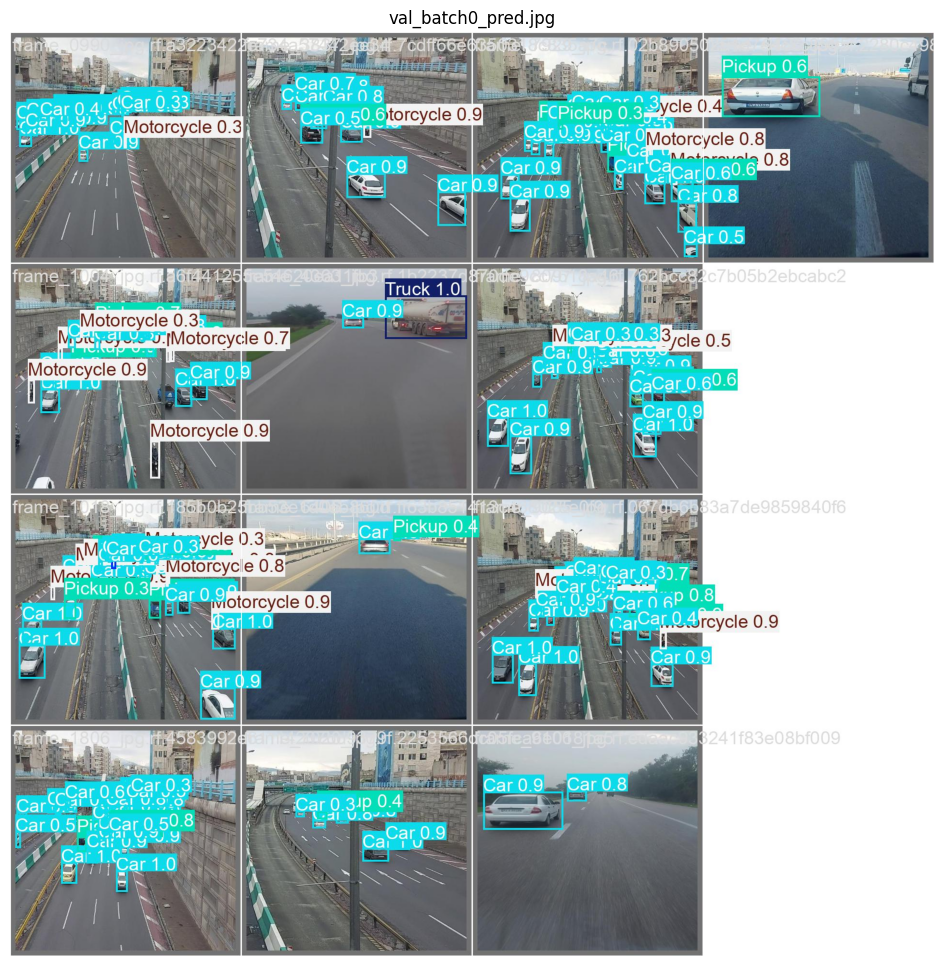

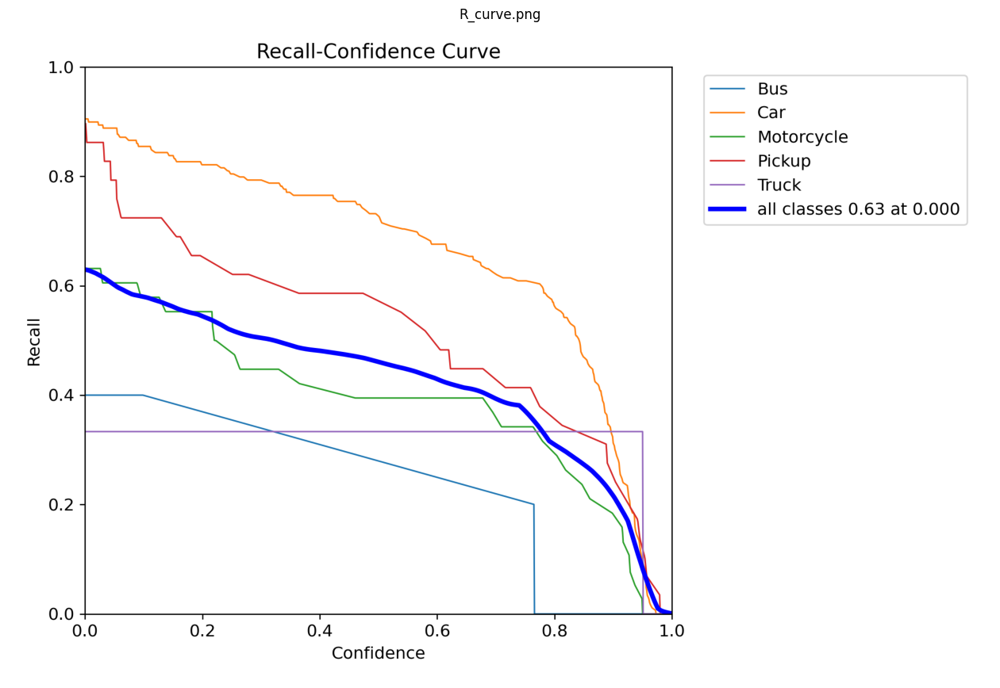

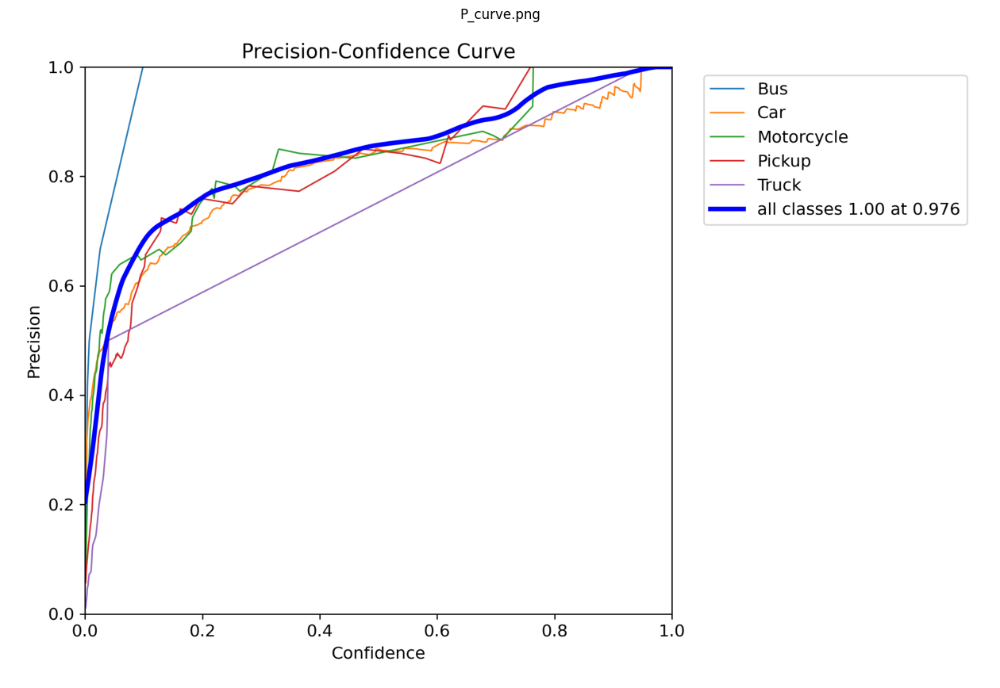

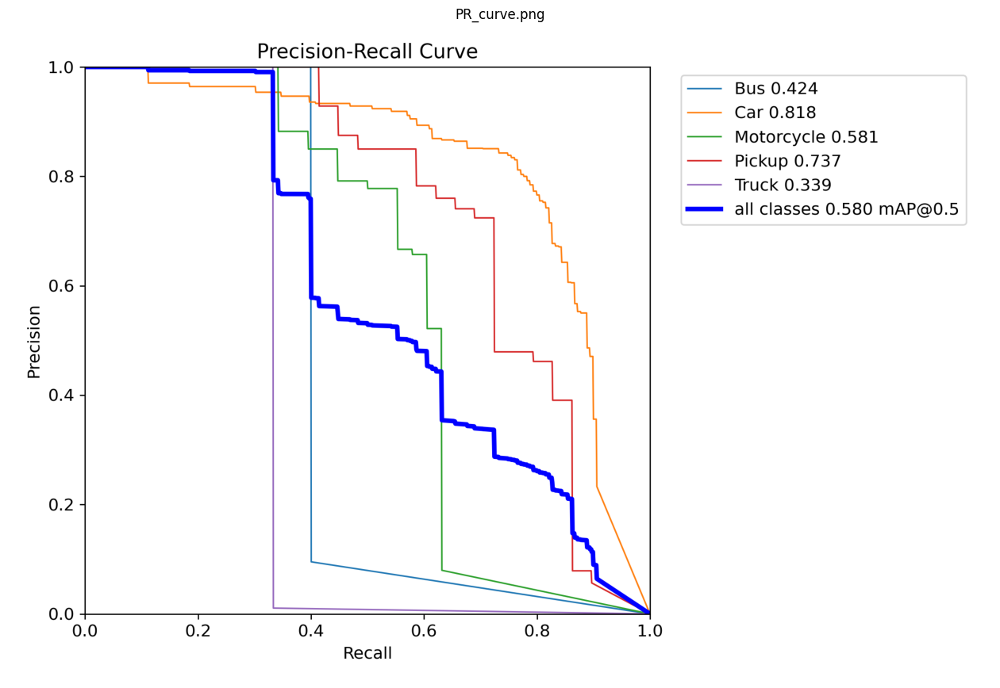

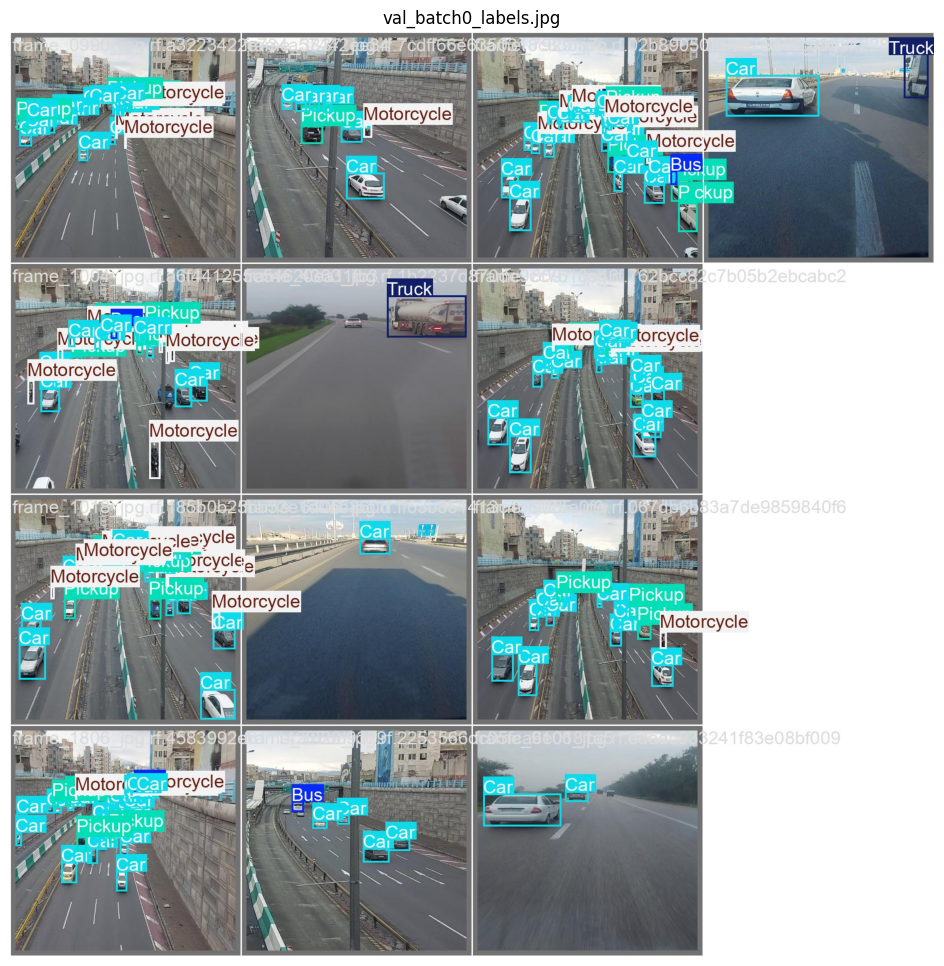

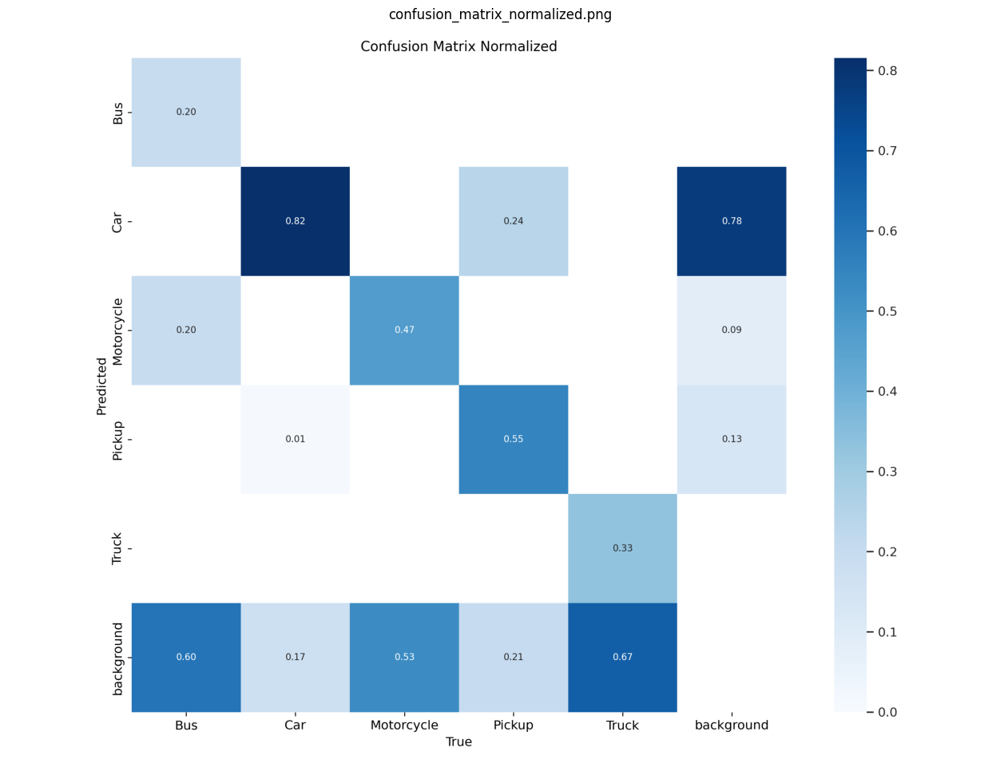

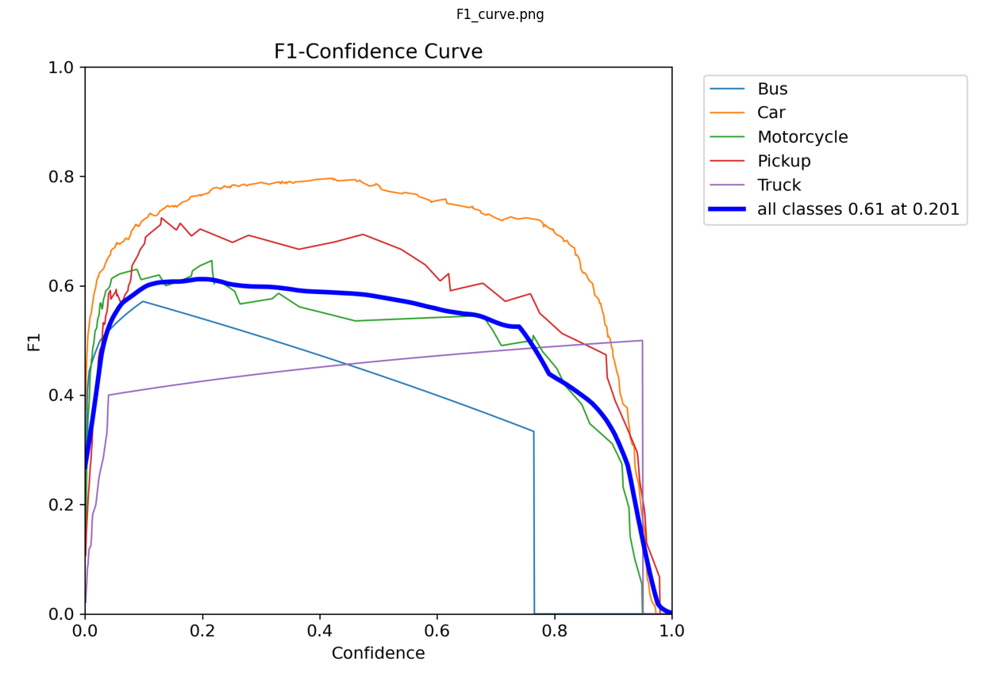

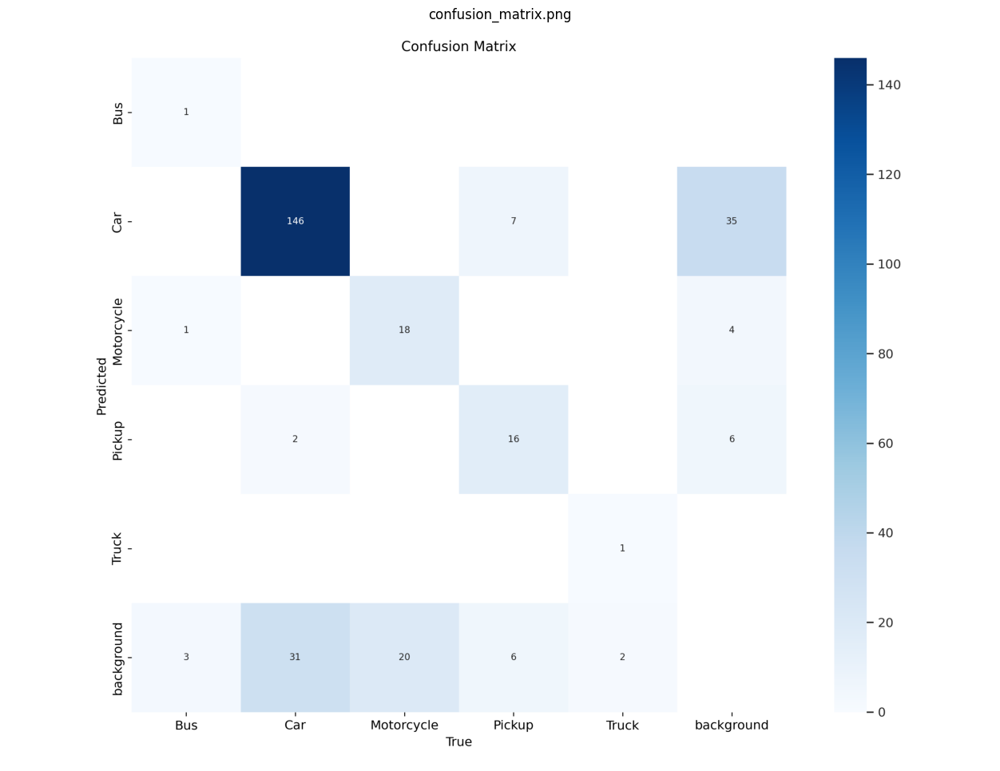

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

# Ensure the save directory path is valid and absolute
folder_path = str(metrics.save_dir)  # Convert to string if necessary

# List all image files in the directory
images = [file for file in os.listdir(folder_path) if file.endswith(('.png', '.jpg'))]

# Display the images
for image in images:
    img_path = os.path.join(folder_path, image)
    img = Image.open(img_path)
    plt.figure(figsize=(16, 12))
    plt.title(image)
    plt.imshow(img)
    plt.axis('off')  # Turn off axes for better visualization
    plt.show()



image 1/1 /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/images/frame_9055_jpg.rf.067db6b83a7de9859840f6ca2484d373.jpg: 640x640 27 Cars, 2 Motorcycles, 4 Pickups, 18.1ms
Speed: 1.7ms preprocess, 18.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


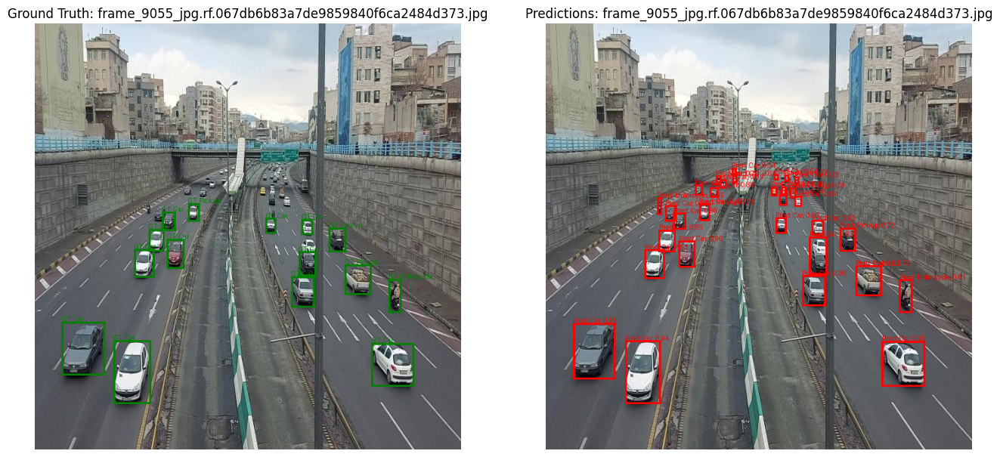


image 1/1 /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/images/frame_7020_jpg.rf.2253566dc05fca6e0181a517bab14339.jpg: 640x640 5 Cars, 1 Pickup, 20.5ms
Speed: 2.3ms preprocess, 20.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


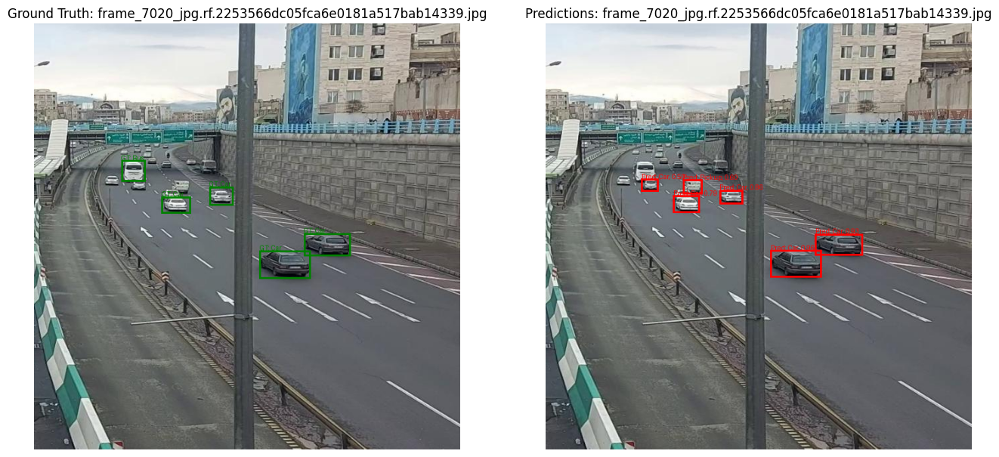


image 1/1 /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/images/frame_3837_jpg.rf.7cdff66e6350318c835a7cf1b35525f0.jpg: 640x640 10 Cars, 1 Motorcycle, 1 Pickup, 23.6ms
Speed: 2.4ms preprocess, 23.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


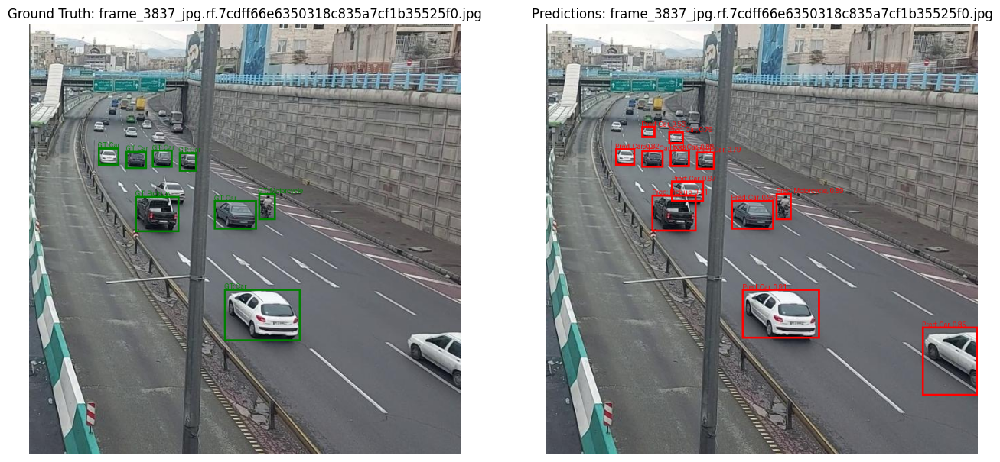

In [ ]:
import os
import random
import yaml
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from ultralytics import YOLO

# Paths to the test images, labels, and data.yaml
test_images_path = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/images'  # Update if needed
test_labels_path = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/labels'  # Update if needed
data_yaml_path = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data.yaml'  # Path to data.yaml

# Load class names from data.yaml
with open(data_yaml_path, 'r') as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml['names']

# Get all test images
test_images = [file for file in os.listdir(test_images_path) if file.endswith(('.png', '.jpg'))]

random_images = random.sample(test_images, 3)

# Loop through the selected images
for random_image in random_images:
    image_path = os.path.join(test_images_path, random_image)
    label_path = os.path.join(test_labels_path, random_image.replace('.jpg', '.txt').replace('.png', '.txt'))

    # Run the prediction
    results = model.predict(source=image_path, save=False, conf=0.25)  # Adjust conf threshold as needed
    predicted_boxes = results[0].boxes.xyxy.cpu().numpy()  # Get predicted bounding boxes (x_min, y_min, x_max, y_max)
    predicted_classes = results[0].boxes.cls.cpu().numpy()  # Get predicted class IDs
    predicted_scores = results[0].boxes.conf.cpu().numpy()  # Get confidence scores

    # Read the ground truth labels
    ground_truth_boxes = []
    ground_truth_classes = []
    with open(label_path, 'r') as file:
        for line in file.readlines():
            parts = line.strip().split()
            cls, x_center, y_center, width, height = map(float, parts)
            ground_truth_classes.append(int(cls))
            x_min = (x_center - width / 2) * Image.open(image_path).width
            y_min = (y_center - height / 2) * Image.open(image_path).height
            x_max = (x_center + width / 2) * Image.open(image_path).width
            y_max = (y_center + height / 2) * Image.open(image_path).height
            ground_truth_boxes.append([x_min, y_min, x_max, y_max])

    # Open the image
    image = Image.open(image_path)

    # Draw ground truth boxes
    image_with_gt = image.copy()
    draw_gt = ImageDraw.Draw(image_with_gt)
    for box, cls in zip(ground_truth_boxes, ground_truth_classes):
        label = class_names[cls]  # Map class index to label name
        draw_gt.rectangle(box, outline="green", width=3)
        draw_gt.text((box[0], box[1] - 10), f"GT: {label}", fill="green")

    # Draw predicted boxes
    image_with_pred = image.copy()
    draw_pred = ImageDraw.Draw(image_with_pred)
    for box, cls, score in zip(predicted_boxes, predicted_classes, predicted_scores):
        label = class_names[int(cls)]  # Map class index to label name
        draw_pred.rectangle(box, outline="red", width=3)
        draw_pred.text((box[0], box[1] - 10), f"Pred: {label}, {score:.2f}", fill="red")

    # Display images
    plt.figure(figsize=(16, 8))
    plt.subplot(1, 2, 1)
    plt.title(f"Ground Truth: {random_image}")
    plt.imshow(image_with_gt)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Predictions: {random_image}")
    plt.imshow(image_with_pred)
    plt.axis('off')

    plt.show()

## Apply Dynamic Augmentation from Kim's code

In [ ]:
import albumentations as A
import cv2
import os

model = YOLO('yolov9t.pt')
model.train(
    data='/content/drive/MyDrive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data_dynamic_augmented.yaml',
    epochs=100,
    batch=32,
    verbose=True,
    augment=True)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov9t.pt, data=/content/drive/MyDrive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data_dynamic_augmented.yaml, epochs=100, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False

train: Scanning /content/drive/MyDrive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/labels.cache... 136 images, 2 backgrounds, 0 corrupt: 100%|██████████| 136/136 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/valid/labels... 28 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28/28 [00:06<00:00,  4.17it/s]

val: New cache created: /content/drive/MyDrive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/valid/labels.cache


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 221 weight(decay=0.0), 228 weight(decay=0.0005), 227 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.54G      1.478      4.261      1.109        270        640: 100%|██████████| 5/5 [00:04<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

                   all         28        563    0.00147      0.124     0.0138    0.00478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.36G      1.416      3.988      1.038        173        640: 100%|██████████| 5/5 [00:01<00:00,  2.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]

                   all         28        563    0.00528      0.214     0.0384     0.0216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.62G      1.398       3.32     0.9683        230        640: 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

                   all         28        563    0.00912      0.239     0.0691     0.0397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100       6.5G      1.443      2.259     0.9631        210        640: 100%|██████████| 5/5 [00:01<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

                   all         28        563     0.0208      0.341      0.146     0.0671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.67G      1.348      1.821     0.9529        186        640: 100%|██████████| 5/5 [00:01<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.937     0.0779      0.166      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.49G        1.3      1.568     0.9409        228        640: 100%|██████████| 5/5 [00:01<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

                   all         28        563     0.0204      0.404      0.204      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       6.3G      1.282      1.469     0.9701        118        640: 100%|██████████| 5/5 [00:01<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


                   all         28        563     0.0403      0.488      0.307      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.31G      1.384      1.432     0.9913        112        640: 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.33it/s]

                   all         28        563     0.0483      0.491      0.331        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.93G      1.306      1.345      0.963        333        640: 100%|██████████| 5/5 [00:01<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]

                   all         28        563     0.0535      0.506      0.344        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.03G      1.273      1.275      0.941        205        640: 100%|██████████| 5/5 [00:01<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


                   all         28        563     0.0536      0.505      0.372      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.37G      1.251      1.233      0.962        110        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.938       0.14      0.389      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100       6.5G       1.22      1.177      0.932        275        640: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

                   all         28        563      0.916      0.102      0.405      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.08G      1.205      1.125     0.9336        318        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


                   all         28        563          1     0.0997      0.393      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.56G      1.164      1.088     0.9256        250        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.50it/s]

                   all         28        563      0.853      0.204      0.419      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.89G       1.17      1.117     0.9242        283        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

                   all         28        563      0.784      0.207      0.451      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.29G      1.142     0.9981      0.917        197        640: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

                   all         28        563      0.639      0.254      0.468      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.51G      1.148      1.061     0.9257        121        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

                   all         28        563      0.858      0.239      0.478      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.94G      1.149      1.033     0.9285        180        640: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]

                   all         28        563      0.818      0.256      0.515      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.26G       1.15          1     0.9238        146        640: 100%|██████████| 5/5 [00:01<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


                   all         28        563      0.788      0.292      0.487      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       6.6G      1.152      1.003     0.9428        138        640: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


                   all         28        563      0.746      0.238      0.496      0.314

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.58G      1.122      1.029     0.9194        195        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]

                   all         28        563      0.605      0.322      0.533      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.63G      1.102     0.9307     0.9036        318        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

                   all         28        563      0.556      0.472      0.542      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.52G      1.082     0.9311     0.9067        136        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.673      0.506      0.588      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.82G      1.107     0.8952     0.9195        156        640: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

                   all         28        563      0.712      0.454      0.583      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       6.6G       1.11     0.9617     0.9259        138        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563        0.7       0.47      0.551       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       6.5G      1.082     0.8946     0.9197        180        640: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


                   all         28        563      0.674      0.511      0.564      0.362

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.37G      1.089     0.8965     0.9194        204        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

                   all         28        563      0.661      0.554      0.604      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.57G      1.043     0.8776     0.9067        162        640: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

                   all         28        563      0.635      0.585      0.615      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.98G      1.058      0.837     0.9123        219        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

                   all         28        563       0.61      0.538      0.606      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.71G      1.088     0.8181     0.9041        281        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


                   all         28        563      0.649      0.568      0.599      0.382

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.32G      1.053     0.8198     0.9129        149        640: 100%|██████████| 5/5 [00:01<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


                   all         28        563      0.651      0.567      0.591      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.71G      1.089     0.8494     0.8961        318        640: 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

                   all         28        563      0.619      0.593      0.591      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      7.01G      1.082      0.837     0.9125        223        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563      0.725      0.569      0.603      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.79G      1.021     0.7894      0.908        178        640: 100%|██████████| 5/5 [00:01<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all         28        563      0.789      0.591       0.63       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.37G      1.034     0.7807     0.8981        222        640: 100%|██████████| 5/5 [00:01<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]

                   all         28        563      0.756      0.639      0.662      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       6.5G      1.065     0.8206     0.9017        285        640: 100%|██████████| 5/5 [00:01<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

                   all         28        563      0.744      0.622      0.642      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.79G       1.04      0.795     0.9081        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

                   all         28        563      0.688      0.612      0.625      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       6.3G     0.9989     0.8129     0.9005        147        640: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


                   all         28        563      0.749      0.634      0.656      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.77G      1.004     0.7547     0.8847        214        640: 100%|██████████| 5/5 [00:01<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


                   all         28        563      0.733      0.658      0.661      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.55G     0.9749     0.7586     0.8989        199        640: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

                   all         28        563      0.674      0.662      0.644      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       6.9G     0.9964     0.7703     0.8938        263        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


                   all         28        563       0.67      0.638      0.629      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.67G      1.042      0.789     0.8959        163        640: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

                   all         28        563      0.679      0.591      0.669      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.93G      1.028     0.7751     0.8909        230        640: 100%|██████████| 5/5 [00:01<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all         28        563      0.733      0.678      0.689      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      7.07G      1.005      0.718     0.9018        264        640: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]

                   all         28        563      0.762      0.631      0.684      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.55G     0.9952     0.7383     0.8922        249        640: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

                   all         28        563      0.659      0.667      0.674      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.45G      1.008      0.732      0.891        172        640: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

                   all         28        563      0.755      0.664      0.705      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      7.49G      0.996     0.7486     0.8957        219        640: 100%|██████████| 5/5 [00:01<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]

                   all         28        563      0.733       0.67      0.711      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.88G      1.043     0.7106     0.8995        235        640: 100%|██████████| 5/5 [00:01<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]

                   all         28        563      0.745      0.688      0.718      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.75G     0.9573     0.7344     0.8795        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.60it/s]

                   all         28        563      0.752       0.64      0.715       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.84G     0.9604     0.7084     0.8841        265        640: 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]

                   all         28        563       0.72      0.657      0.691      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.47G     0.9752     0.6992     0.8882        234        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

                   all         28        563      0.773      0.699      0.718      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.32G     0.9344     0.7356      0.886         75        640: 100%|██████████| 5/5 [00:01<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         28        563      0.792      0.609      0.718      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.56G     0.9868     0.7146     0.9001        264        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


                   all         28        563      0.753      0.659      0.733      0.482

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.71G     0.9558     0.6975     0.8881        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


                   all         28        563      0.761      0.693      0.721      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.52G     0.9314      0.686     0.8864        124        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.87it/s]

                   all         28        563      0.828      0.617      0.694      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.88G     0.9751     0.6996     0.8938        218        640: 100%|██████████| 5/5 [00:01<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]

                   all         28        563      0.808      0.717      0.718      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.79G     0.9316     0.7269     0.8907        112        640: 100%|██████████| 5/5 [00:01<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.68it/s]

                   all         28        563      0.789      0.723      0.722      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.32G     0.9586     0.6822     0.8916        342        640: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


                   all         28        563      0.754      0.729      0.724      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.52G     0.9722     0.6794     0.8975        149        640: 100%|██████████| 5/5 [00:01<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all         28        563      0.781      0.732      0.731      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       6.5G     0.9391     0.6857     0.8927        253        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]

                   all         28        563      0.755      0.713      0.717      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.54G     0.9712     0.6707     0.8903        344        640: 100%|██████████| 5/5 [00:01<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]

                   all         28        563      0.729      0.743      0.724      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.39G     0.9314     0.6468     0.8788        197        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


                   all         28        563      0.767      0.695      0.736      0.482

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.23G     0.9121     0.6507     0.8803        207        640: 100%|██████████| 5/5 [00:01<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]

                   all         28        563      0.733      0.724      0.735       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       6.7G     0.9197     0.6667     0.8757        157        640: 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


                   all         28        563      0.765      0.697      0.715      0.468

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.88G     0.8972     0.6438     0.8851        257        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

                   all         28        563      0.726      0.717      0.713      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.34G     0.9071     0.6408     0.8855        135        640: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

                   all         28        563      0.808      0.719      0.736      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.44G     0.9101     0.6435     0.8712        269        640: 100%|██████████| 5/5 [00:01<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.80it/s]

                   all         28        563      0.732      0.743      0.741      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      7.12G     0.9251     0.6372      0.866        274        640: 100%|██████████| 5/5 [00:01<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.57it/s]

                   all         28        563      0.771      0.682      0.731      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.06G     0.9392     0.6459     0.8913        115        640: 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]

                   all         28        563      0.708      0.721       0.73      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.47G     0.8767     0.6462     0.8839         79        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all         28        563      0.754        0.7       0.72      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      7.17G     0.9577     0.6704     0.8809        315        640: 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]

                   all         28        563      0.756      0.713      0.728      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.28G     0.9467     0.6392     0.8717        316        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

                   all         28        563      0.774      0.716      0.714      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      7.15G     0.9368     0.6292     0.8732        299        640: 100%|██████████| 5/5 [00:01<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


                   all         28        563      0.782      0.712      0.704      0.467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.34G      0.868     0.6015      0.869        213        640: 100%|██████████| 5/5 [00:01<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

                   all         28        563      0.749      0.703      0.706      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.63G     0.9275     0.6601      0.878        222        640: 100%|██████████| 5/5 [00:01<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]

                   all         28        563      0.799      0.674      0.728      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.79G      0.897     0.6464     0.8712        180        640: 100%|██████████| 5/5 [00:01<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]

                   all         28        563      0.795      0.686      0.741      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.29G     0.8771     0.6021     0.8728        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         28        563      0.756      0.732      0.724      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       6.4G     0.8556     0.6158     0.8608        156        640: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


                   all         28        563      0.744      0.728      0.726      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.26G     0.9064     0.6032     0.8683        244        640: 100%|██████████| 5/5 [00:01<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]

                   all         28        563      0.776      0.683      0.734      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      7.09G     0.8899     0.6319     0.8731        302        640: 100%|██████████| 5/5 [00:01<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]

                   all         28        563      0.768      0.722       0.75      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.47G     0.8722      0.604     0.8718        167        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


                   all         28        563      0.747       0.66      0.736      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.51G     0.8797     0.5962     0.8666        253        640: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

                   all         28        563      0.737       0.71      0.744      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.91G     0.8755      0.603     0.8663        177        640: 100%|██████████| 5/5 [00:01<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         28        563      0.762       0.71      0.758      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.41G     0.8871     0.5944     0.8677        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

                   all         28        563       0.77      0.713      0.747      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.98G     0.8809     0.6052       0.87        148        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]

                   all         28        563       0.81      0.683      0.747      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.34G     0.8513     0.5848     0.8591        182        640: 100%|██████████| 5/5 [00:01<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


                   all         28        563      0.828      0.687      0.735       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.23G      0.857     0.5782     0.8697        179        640: 100%|██████████| 5/5 [00:01<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]

                   all         28        563      0.806       0.72      0.755      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.24G     0.8645     0.5822     0.8665        158        640: 100%|██████████| 5/5 [00:01<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]

                   all         28        563       0.76       0.74      0.749      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       6.4G     0.8679     0.5989     0.8661        274        640: 100%|██████████| 5/5 [00:01<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]

                   all         28        563      0.755      0.746      0.754      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.28G     0.8617     0.6302     0.8591        117        640: 100%|██████████| 5/5 [00:01<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]

                   all         28        563      0.823      0.711       0.76      0.512


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      5.93G     0.8379     0.5681     0.8598        122        640: 100%|██████████| 5/5 [00:03<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

                   all         28        563       0.79      0.737      0.753      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.08G     0.8719     0.5646     0.8653        212        640: 100%|██████████| 5/5 [00:01<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]

                   all         28        563      0.793      0.732      0.748      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      5.84G     0.8536     0.5664     0.8702        215        640: 100%|██████████| 5/5 [00:01<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

                   all         28        563       0.77      0.704      0.744      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      5.69G     0.8571     0.5652     0.8632        124        640: 100%|██████████| 5/5 [00:01<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

                   all         28        563      0.788      0.704      0.744      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      5.95G     0.8611     0.5584     0.8586        206        640: 100%|██████████| 5/5 [00:01<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]

                   all         28        563      0.801      0.707      0.751      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      5.95G     0.8315     0.5714     0.8594        116        640: 100%|██████████| 5/5 [00:01<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]

                   all         28        563      0.821      0.695      0.746      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      5.89G     0.8439     0.5481     0.8649        157        640: 100%|██████████| 5/5 [00:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]

                   all         28        563       0.83      0.692      0.754      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       5.7G     0.8332     0.5544     0.8601        103        640: 100%|██████████| 5/5 [00:01<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


                   all         28        563      0.826      0.691      0.759      0.512

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      5.74G     0.8489     0.5509     0.8603        154        640: 100%|██████████| 5/5 [00:01<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


                   all         28        563       0.83      0.689      0.765      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      5.73G     0.8256     0.5402     0.8482        201        640: 100%|██████████| 5/5 [00:01<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]

                   all         28        563      0.819      0.717      0.767       0.52



100 epochs completed in 0.092 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 4.6MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 4.6MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9t summary (fused): 486 layers, 1,971,759 parameters, 0 gradients, 7.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


                   all         28        563      0.786      0.726      0.754      0.511
                   Bus          6          6        0.7      0.833      0.699      0.539
                   Car         23        398      0.789      0.749      0.809      0.569
            Motorcycle         18         92      0.879      0.543      0.659      0.346
                Pickup         22         59      0.863      0.627      0.767       0.51
                 Truck          8          8        0.7      0.875      0.837      0.591
Speed: 0.2ms preprocess, 9.6ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/train3


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7918bb26dab0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
# Path to the directory where YOLO saves training outputs
runs_path = '/content/runs/detect'

# Find the most recent training directory
latest_run = max([os.path.join(runs_path, d) for d in os.listdir(runs_path)], key=os.path.getmtime)

# Path to the best weights file
best_weights_path = os.path.join(latest_run, 'weights', 'best.pt')

# Load the model with the found best weights
model = YOLO(best_weights_path)

print(f"Loaded model from: {best_weights_path}")

metrics = model.val(
    data='/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data.yaml',
    split='test'
)

# Print evaluation metrics
print(metrics)

Loaded model from: /content/runs/detect/train3/weights/best.pt
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9t summary (fused): 486 layers, 1,971,759 parameters, 0 gradients, 7.6 GFLOPs


val: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/labels.cache... 13 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13/13 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.84s/it]


                   all         13        254      0.802      0.493      0.557      0.398
                   Bus          5          5          1      0.391      0.402      0.261
                   Car         12        179      0.783      0.786      0.813      0.588
            Motorcycle          8         38      0.831      0.474      0.541      0.324
                Pickup          8         29      0.786      0.483      0.666      0.488
                 Truck          3          3      0.609      0.333      0.365      0.329
Speed: 0.3ms preprocess, 14.9ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7916f84d8d90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results

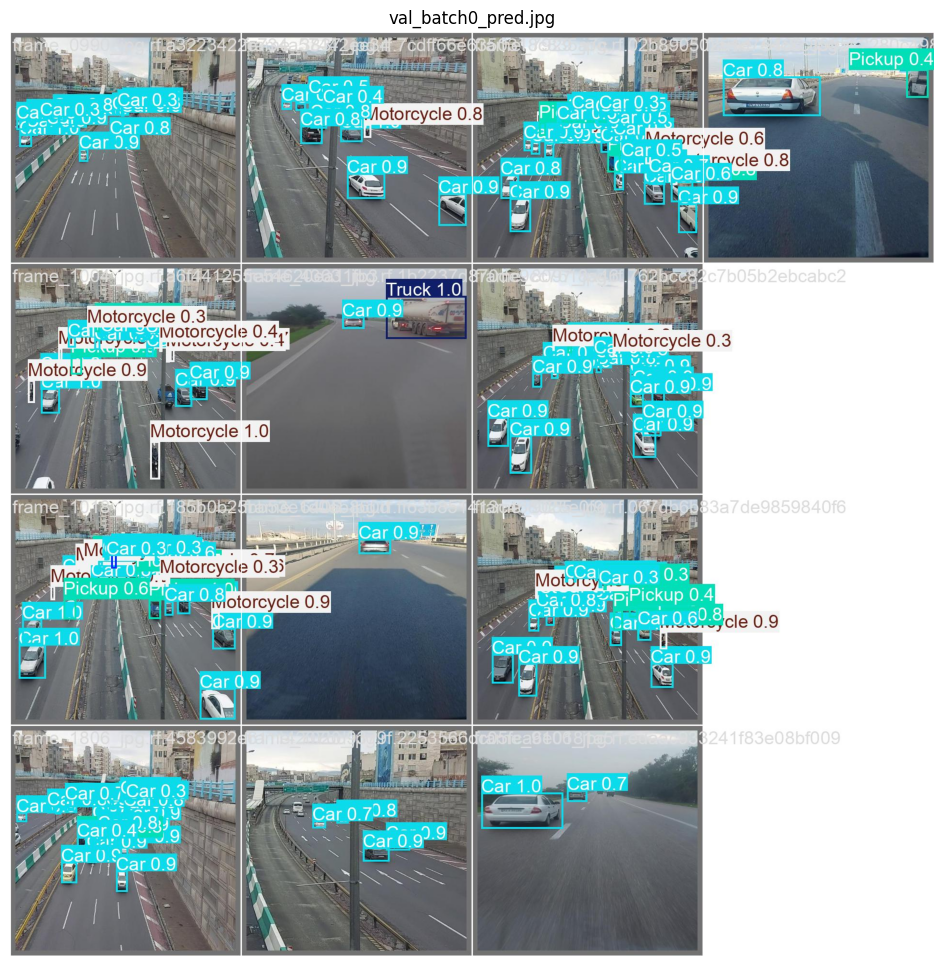

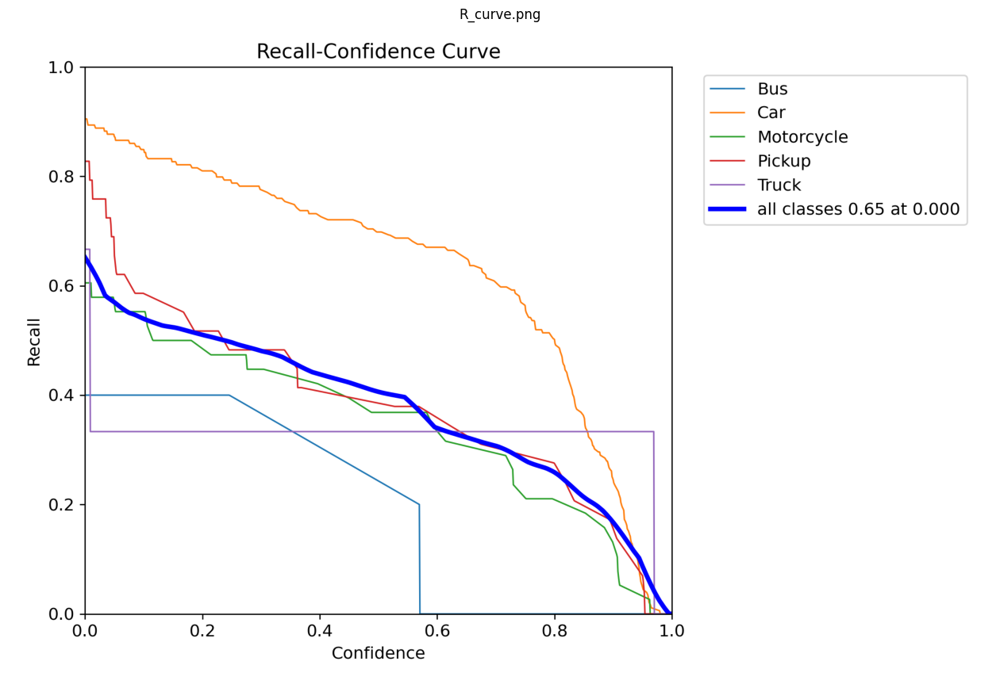

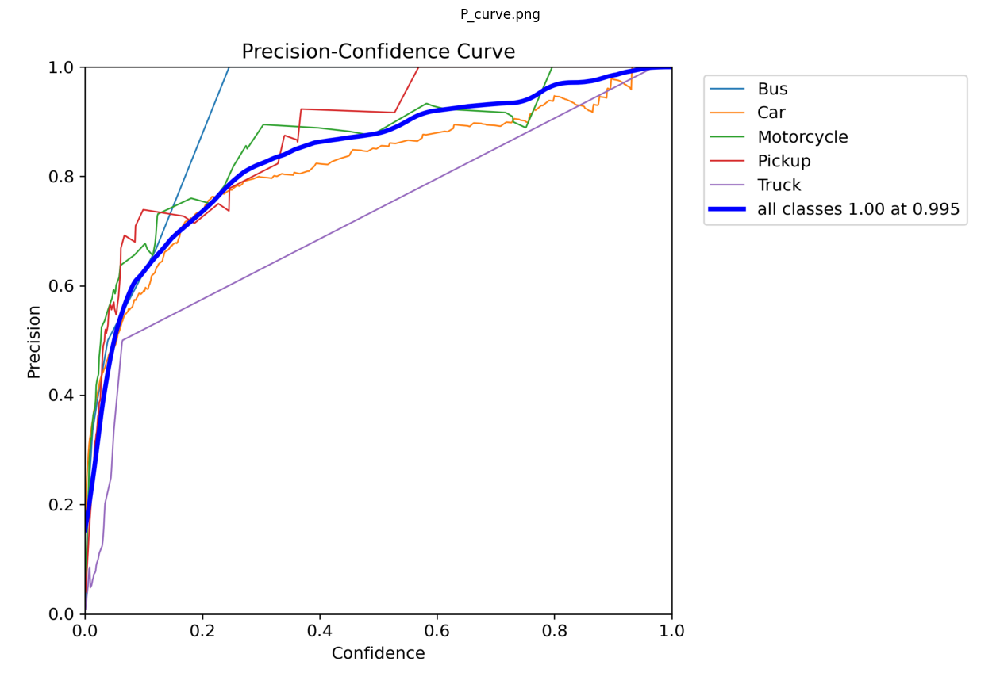

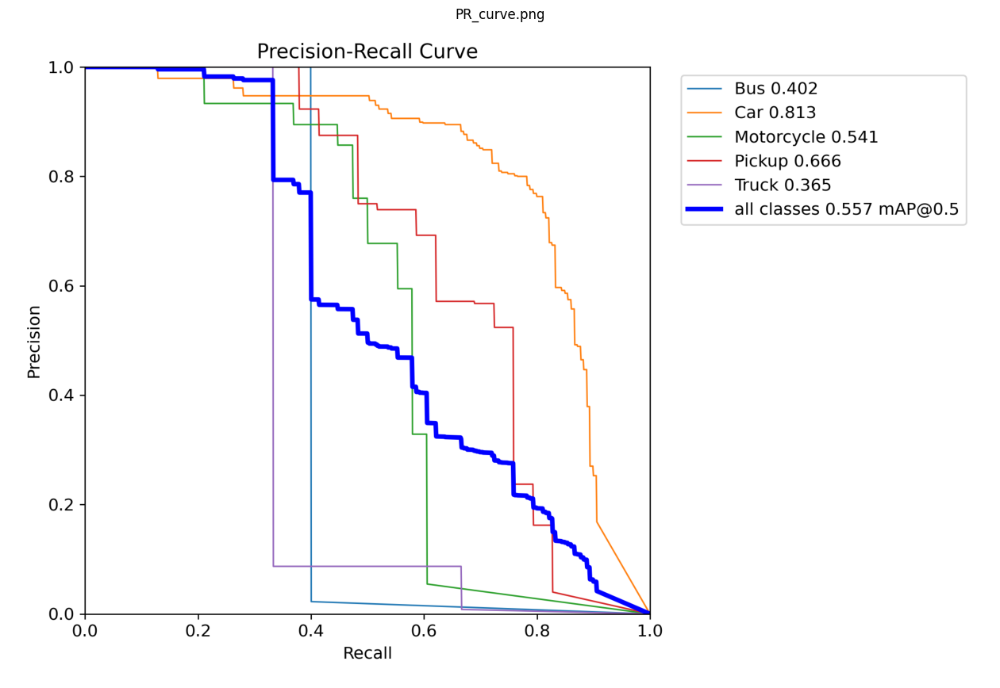

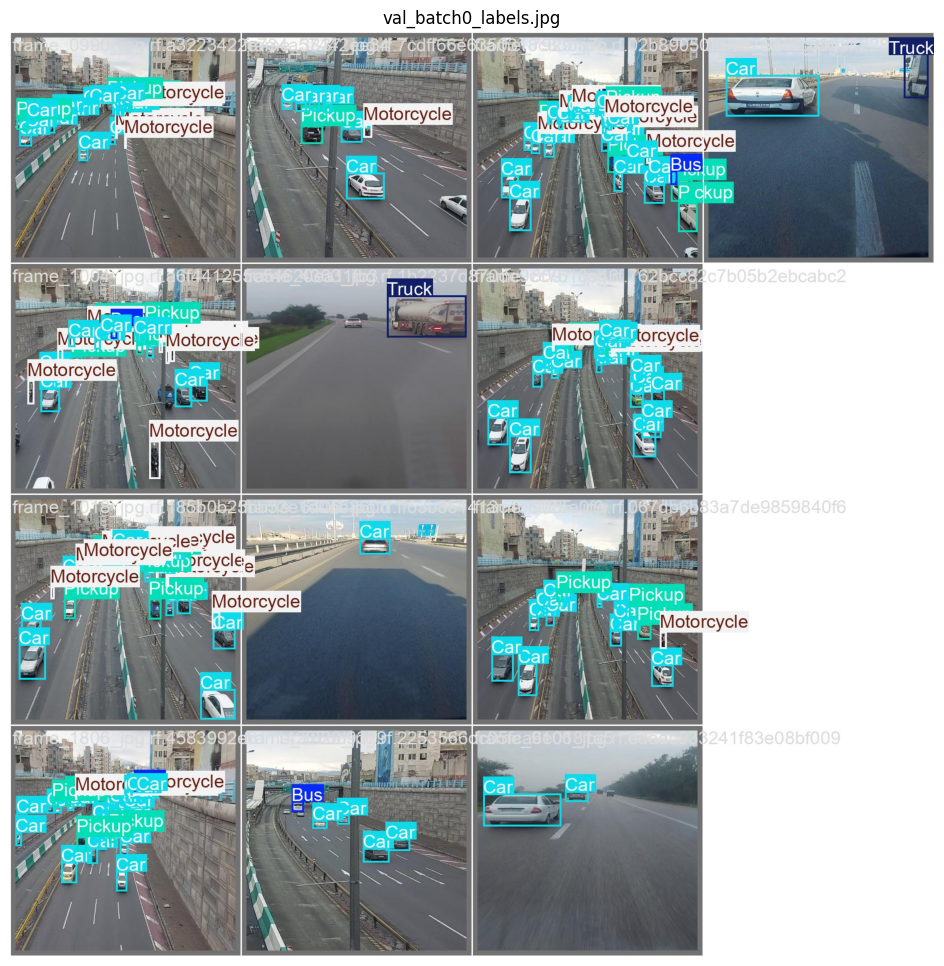

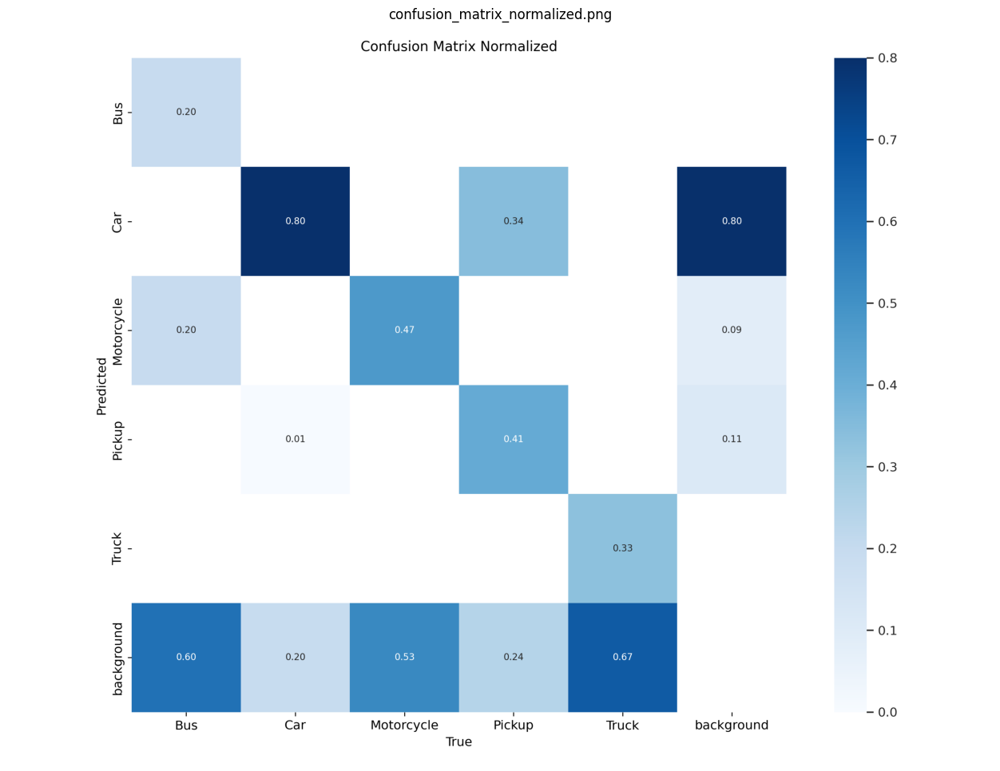

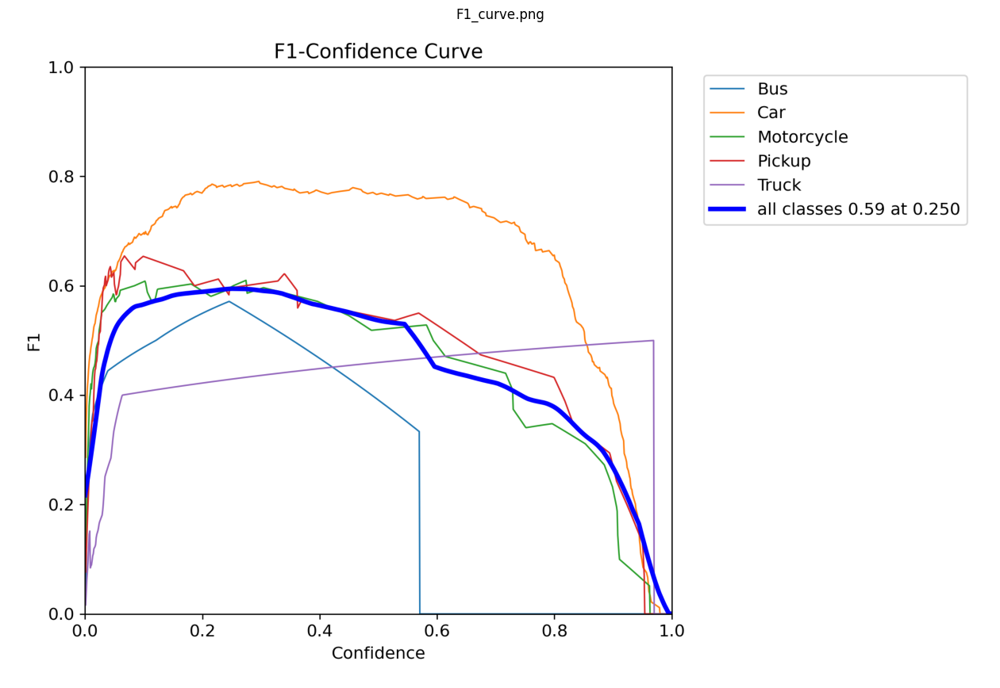

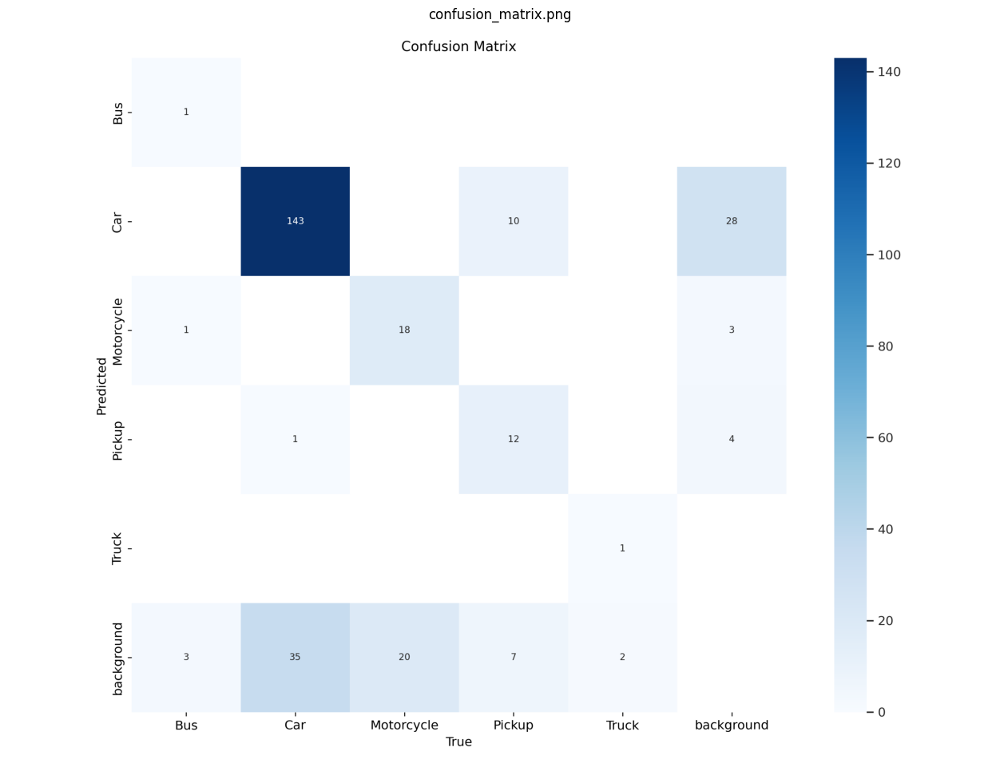

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

# Ensure the save directory path is valid and absolute
folder_path = str(metrics.save_dir)  # Convert to string if necessary

# List all image files in the directory
images = [file for file in os.listdir(folder_path) if file.endswith(('.png', '.jpg'))]

# Display the images
for image in images:
    img_path = os.path.join(folder_path, image)
    img = Image.open(img_path)
    plt.figure(figsize=(16, 12))
    plt.title(image)
    plt.imshow(img)
    plt.axis('off')  # Turn off axes for better visualization
    plt.show()


## Static Image Augmentations

In [ ]:
import albumentations as A
import cv2
import os
import shutil
import numpy as np

# Paths to images and labels
images_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/images'
labels_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/labels'
augmented_images_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/augmented_images'
augmented_labels_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/augmented_labels'

# Vehicle class names (mapping class IDs to vehicle types)
class_names = {0: 'Bus', 1: 'Car', 2: 'Motorcycle', 3: 'Pickup', 4: 'Truck'}

# Classes to augment (non-dominant classes only)
classes_to_augment = [0, 2, 3, 4]  # Exclude 'Car' (class ID: 1)

# Create directories for augmented data
os.makedirs(augmented_images_folder, exist_ok=True)
os.makedirs(augmented_labels_folder, exist_ok=True)

# Enhanced augmentation pipeline
transform = A.Compose(
    [
        A.Rotate(limit=30, p=0.5),  # Rotate images by up to 30 degrees
        A.HorizontalFlip(p=0.5),   # Horizontal flip
        A.VerticalFlip(p=0.2),     # Vertical flip
        A.RandomBrightnessContrast(p=0.5),  # Adjust brightness and contrast
        A.ColorJitter(p=0.5),      # Add photometric distortion
        A.Blur(blur_limit=3, p=0.2),  # Add blur
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=30, p=0.5),  # Combine shift, scale, rotate
    ],
    bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels'])
)

# MixUp augmentation function
def mixup(image1, bboxes1, class_labels1, image2, bboxes2, class_labels2, alpha=0.2):
    """Perform MixUp augmentation."""
    lam = np.random.beta(alpha, alpha)
    mixed_image = (lam * image1 + (1 - lam) * image2).astype(np.uint8)
    mixed_bboxes = bboxes1 + bboxes2  # Simply concatenate bounding boxes
    mixed_class_labels = class_labels1 + class_labels2
    return mixed_image, mixed_bboxes, mixed_class_labels

# Function to save augmented labels
def save_augmented_labels(output_label_path, class_labels, bboxes):
    os.makedirs(os.path.dirname(output_label_path), exist_ok=True)
    with open(output_label_path, 'w') as f:
        for class_id, bbox in zip(class_labels, bboxes):
            bbox_str = ' '.join(map(str, bbox))
            f.write(f"{int(class_id)} {bbox_str}\n")

# Function to apply MixUp multiple times
def apply_mixup_multiple_times(image, bboxes, class_labels, images_folder, labels_folder, mixup_times=2):
    for _ in range(mixup_times):
        # Pick a random image for MixUp
        image_files = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
        random_image_file = np.random.choice(image_files)
        random_image_path = os.path.join(images_folder, random_image_file)
        random_label_path = os.path.join(labels_folder, random_image_file.rsplit('.', 1)[0] + '.txt')

        if os.path.exists(random_image_path) and os.path.exists(random_label_path):
            random_image = cv2.imread(random_image_path)
            with open(random_label_path, 'r') as f:
                random_labels = [list(map(float, line.strip().split())) for line in f]
            random_class_labels = [label[0] for label in random_labels]
            random_bboxes = [label[1:] for label in random_labels]

            # Apply MixUp
            image, bboxes, class_labels = mixup(image, bboxes, class_labels, random_image, random_bboxes, random_class_labels)

    return image, bboxes, class_labels

# Define the number of augmented images to produce per original
num_augmentations_per_image = 3

# Augment images and labels
image_files = [f for f in os.listdir(images_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
for i, image_file in enumerate(image_files):
    # Paths for images and labels
    image_path = os.path.join(images_folder, image_file)
    label_path = os.path.join(labels_folder, image_file.rsplit('.', 1)[0] + '.txt')

    # Paths for saving original images and labels
    original_image_path = os.path.join(augmented_images_folder, image_file)
    original_label_path = os.path.join(augmented_labels_folder, image_file.rsplit('.', 1)[0] + '.txt')

    # Copy original images and labels to the augmented folders
    shutil.copy(image_path, original_image_path)
    if os.path.exists(label_path):
        shutil.copy(label_path, original_label_path)

        # Read labels to check for non-dominant classes
        with open(label_path, 'r') as f:
            labels = [list(map(float, line.strip().split())) for line in f]

        class_labels = [label[0] for label in labels]
        bboxes = [label[1:] for label in labels]

        # Check if the image does not contain any cars (class_id = 1)
        if 1 not in class_labels:
          # Map class labels to vehicle types
          vehicle_types = [class_names.get(int(cls), "Unknown") for cls in class_labels]

          # Print the current image and its vehicle types
          print(f"Augmenting image: {image_file}")
          print(f"Vehicles in the image: {', '.join(set(vehicle_types))}")

          for n in range(num_augmentations_per_image):
              # Apply augmentation
              augmented = transform(image=cv2.imread(image_path), bboxes=bboxes, class_labels=class_labels)
              augmented_image = augmented['image']
              augmented_bboxes = augmented['bboxes']
              augmented_class_labels = augmented['class_labels']

              # Optionally apply MixUp
              if np.random.rand() < 0.5:
                  augmented_image, augmented_bboxes, augmented_class_labels = apply_mixup_multiple_times(
                      augmented_image, augmented_bboxes, augmented_class_labels, images_folder, labels_folder, mixup_times=3
                  )

              # Save augmented data with a prefix
              output_image_path = os.path.join(augmented_images_folder, f"aug_{n}_{image_file}")
              output_label_path = os.path.join(augmented_labels_folder, f"aug_{n}_{image_file.rsplit('.', 1)[0]}.txt")
              cv2.imwrite(output_image_path, augmented_image)
              save_augmented_labels(output_label_path, augmented_class_labels, augmented_bboxes)


print("Saving all original images and selectively augmenting completed.")


Augmenting image: frame_1278_jpg.rf.8a8c71e65efe7d5dff46671cdab7568e.jpg
Vehicles in the image: Truck
Augmenting image: frame_4426_jpg.rf.b012e820ab7f08caca56ff32d8dd8d1d.jpg
Vehicles in the image: Pickup, Truck
Augmenting image: frame_3414_jpg.rf.e367b44ea7a934f44a79e595e642cd94.jpg
Vehicles in the image: Truck
Augmenting image: frame_4574_jpg.rf.532ead97a5ef329a662b7a6000fb5dcc.jpg
Vehicles in the image: Truck
Augmenting image: frame_4426_jpg.rf.7ee419dc9958fbadd78555c248498c20.jpg
Vehicles in the image: Pickup, Truck
Augmenting image: frame_6853_jpg.rf.5466f619eee421202b4f8c640bb6d7c8.jpg
Vehicles in the image: Pickup, Truck
Augmenting image: frame_7498_jpg.rf.198c0497ed35283dce2324bc8aec6251.jpg
Vehicles in the image: Truck
Augmenting image: frame_7192_jpg.rf.9c6d8e6aacab0659299ca36ba31b2b6d.jpg
Vehicles in the image: 
Augmenting image: frame_7192_jpg.rf.2cbd94f19d0ac2936a2e1652c6e9faf0.jpg
Vehicles in the image: 
Augmenting image: frame_7498_jpg.rf.77d305597b10b64c397b93b0762a681c

In [ ]:
import os

images_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/augmented_images'
labels_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/augmented_labels'

# Validation functions
def validate_labels():
    all_good = True

    for image_file in os.listdir(images_folder):
        if image_file.endswith(('.jpg', '.jpeg', '.png')):
            label_file = os.path.join(labels_folder, image_file.rsplit('.', 1)[0] + '.txt')
            if not os.path.exists(label_file):
                print(f"Missing label for image: {image_file}")
                all_good = False
            else:
                with open(label_file, 'r') as f:
                    lines = f.readlines()
                    for line_num, line in enumerate(lines, start=1):
                        parts = line.strip().split()
                        if len(parts) != 5:
                            print(f"Invalid format in {label_file}, line {line_num}: {line.strip()}")
                            all_good = False
                        else:
                            try:
                                class_id = int(parts[0])
                                bbox = [float(x) for x in parts[1:]]
                                if not all(0 <= x <= 1 for x in bbox):
                                    print(f"Out-of-range values in {label_file}, line {line_num}: {line.strip()}")
                                    all_good = False
                            except ValueError:
                                print(f"Non-numeric value in {label_file}, line {line_num}: {line.strip()}")
                                all_good = False
    return all_good

if validate_labels():
    print("Validation completed successfully: All images have labels and labels are formatted correctly!")
else:
    print("Validation failed. Please check above issues.")


Validation completed successfully: All images have labels and labels are formatted correctly!


In [ ]:
import os
import shutil

# Define folders
augmented_images_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/augmented_images'
augmented_labels_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train/augmented_labels'
combined_folder = '/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train_combined'

# Create combined folder if it doesn't exist
os.makedirs(combined_folder, exist_ok=True)

# Function to copy files from a source folder to the combined folder
def copy_files(source_folder, combined_folder):
    for file in os.listdir(source_folder):
        source_path = os.path.join(source_folder, file)
        destination_path = os.path.join(combined_folder, file)
        shutil.copy(source_path, destination_path)

# Copy augmented files to the combined folder
print("Copying augmented images and labels...")
copy_files(augmented_images_folder, combined_folder)
copy_files(augmented_labels_folder, combined_folder)

print("Combined folder created with all data (original + augmented).")


Copying augmented images and labels...
Combined folder created with all data (original + augmented).


In [ ]:
model = YOLO('yolov9m.pt')

model.train(
    data='/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data_static_dynamic_augmented.yaml',
    epochs=200,
    batch=32,
    verbose=True,
    augment=True,
    patience=25
)

100%|██████████| 39.1M/39.1M [00:00<00:00, 45.6MB/s]


Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov9m.pt, data=/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data_static_dynamic_augmented.yaml, epochs=200, time=None, patience=25, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=True, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames

100%|██████████| 755k/755k [00:00<00:00, 118MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1    171648  ultralytics.nn.modules.block.RepNCSPELAN4    [64, 128, 128, 64, 1]         
  3                  -1  1    276960  ultralytics.nn.modules.block.AConv           [128, 240]                    
  4                  -1  1    629520  ultralytics.nn.modules.block.RepNCSPELAN4    [240, 240, 240, 120, 1]       
  5                  -1  1    778320  ultralytics.nn.modules.block.AConv           [240, 360]                    
  6                  -1  1   1414080  ultralytics.nn.modules.block.RepNCSPELAN4    [360, 360, 360, 180, 1]       
  7                  -1  1   1556160  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 355MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train_combined... 175 images, 4 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:01<00:00, 115.04it/s]

train: WARNING ⚠️ /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train_combined/aug_0_frame_4426_jpg.rf.b012e820ab7f08caca56ff32d8dd8d1d.jpg: 44 duplicate labels removed
train: New cache created: /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/train_combined.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/valid/labels.cache... 28 images, 0 backgrounds, 0 corrupt: 100%|██████████| 28/28 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 149 weight(decay=0.0), 156 weight(decay=0.0005), 155 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      17.6G      1.563      3.687      1.184        432        640: 100%|██████████| 6/6 [00:06<00:00,  1.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:05<00:00,  5.06s/it]

                   all         28        563      0.643      0.141      0.154     0.0809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      17.2G      1.378      1.906      1.135        434        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

                   all         28        563      0.356      0.426      0.336      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      17.3G       1.31      1.319      1.075        336        640: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

                   all         28        563      0.337       0.36      0.377      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      16.6G      1.244      1.148      1.062        798        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

                   all         28        563      0.618      0.554      0.576      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      16.7G      1.192        1.1      1.059        356        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

                   all         28        563      0.454      0.571      0.501      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      17.6G      1.177     0.9717      1.042        506        640: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         28        563      0.624      0.489      0.496      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      17.1G      1.174      1.086      1.026        287        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         28        563      0.652      0.505      0.533      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      16.9G      1.182      0.967      1.032        464        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         28        563      0.541      0.628      0.537      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      17.8G       1.21     0.9638      1.052        476        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         28        563      0.586       0.53      0.512       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      17.1G      1.168     0.8896      1.036        388        640: 100%|██████████| 6/6 [00:04<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         28        563      0.632      0.621      0.594      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      17.8G      1.145      0.935      1.028        349        640: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         28        563      0.565      0.668      0.569      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      17.3G      1.161     0.9443      1.041        443        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         28        563      0.634      0.613      0.595      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      17.7G      1.161     0.8868      1.029        508        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.07it/s]

                   all         28        563      0.656      0.631      0.597      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      17.1G      1.151     0.9116      1.051        279        640: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         28        563      0.619      0.562      0.584      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      17.4G      1.173     0.8701      1.044        464        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         28        563      0.506      0.595      0.525      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      17.8G      1.264     0.9583      1.064        886        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         28        563      0.556      0.488      0.467      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      17.7G      1.159     0.8996      1.017        422        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         28        563        0.5      0.342      0.347      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200        17G      1.117      0.857      1.018        393        640: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         28        563      0.501      0.616      0.461      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      17.6G      1.155     0.8854      1.005        340        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.613      0.537      0.535      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      16.9G      1.108     0.8315      1.011        412        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

                   all         28        563      0.625      0.617        0.6      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      17.3G      1.125     0.8568      1.029        374        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.734      0.605      0.645      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      17.6G      1.101     0.8358      1.014        403        640: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

                   all         28        563      0.698      0.672      0.653      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      17.8G      1.136     0.8192      1.016        336        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         28        563       0.62      0.456      0.501      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      17.8G      1.174     0.8695      1.037        443        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         28        563       0.59      0.616      0.625      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      18.1G      1.155     0.8398      1.013        542        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.642      0.573      0.577      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      18.5G      1.133     0.8375      1.008        528        640: 100%|██████████| 6/6 [00:04<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.96it/s]

                   all         28        563      0.634      0.692      0.648       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200        17G      1.124     0.8645      1.031        466        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.92it/s]

                   all         28        563      0.701       0.58       0.62       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      17.2G      1.115     0.7978     0.9908        408        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

                   all         28        563      0.779      0.589      0.632      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      17.9G      1.099     0.8504          1        400        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         28        563      0.669       0.62      0.636      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      17.3G      1.107      0.844      1.008        566        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

                   all         28        563      0.664       0.63      0.636      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      17.3G       1.14     0.7951      1.015        546        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.686       0.66      0.676       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      17.9G      1.038     0.7063     0.9746        427        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         28        563      0.684      0.639      0.718      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      17.6G       1.07     0.7836      1.011        614        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.776      0.662      0.756      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      18.1G      1.092     0.7615      0.975        495        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

                   all         28        563      0.758      0.694      0.703      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      17.5G      1.094     0.8193      1.004        358        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         28        563      0.723      0.722      0.719      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      17.8G      1.074     0.7754     0.9976        449        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.737      0.731      0.754      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      17.4G      1.033     0.7364     0.9752        377        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.86it/s]

                   all         28        563      0.742      0.575      0.638      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      17.2G      1.056     0.7295      0.989        442        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         28        563      0.757      0.611      0.708      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      18.2G      1.063     0.7552     0.9785        547        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         28        563      0.654      0.698      0.681      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      17.6G      1.079     0.7684       0.99        475        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         28        563       0.63      0.704      0.699      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      17.5G      1.069     0.7224     0.9842        585        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         28        563      0.624      0.671      0.713      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      17.3G      1.063     0.7492      1.001        268        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         28        563      0.643      0.724      0.676      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      17.2G      1.024     0.7723     0.9871        393        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         28        563      0.568      0.577      0.608      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200        18G      0.999      0.689     0.9669        452        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         28        563      0.694      0.644      0.663      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      17.8G       1.04     0.7325     0.9781        748        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         28        563       0.66      0.708      0.673       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      18.3G      1.071     0.7399      0.983        342        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

                   all         28        563      0.647      0.616      0.623      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      17.1G      1.051     0.7122     0.9773        488        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         28        563      0.677      0.671      0.685      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      17.8G      1.032     0.7059     0.9832        496        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

                   all         28        563      0.657      0.721      0.675      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      17.8G      1.008     0.6714     0.9645        443        640: 100%|██████████| 6/6 [00:04<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         28        563      0.621      0.658      0.665      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      17.3G     0.9822     0.6578     0.9622        412        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         28        563       0.62      0.725      0.671      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      17.4G       1.03      0.705      1.004        333        640: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         28        563      0.659       0.69      0.706      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      17.3G       1.01     0.6902     0.9634        543        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

                   all         28        563      0.684      0.693       0.72      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      18.6G      1.022     0.6867      0.967        314        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.743      0.617      0.712      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      17.3G     0.9367      0.654     0.9618        258        640: 100%|██████████| 6/6 [00:04<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.89it/s]

                   all         28        563      0.789      0.661      0.715      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      17.6G      1.022     0.7124     0.9715        523        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.04it/s]

                   all         28        563      0.831      0.649      0.717      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      17.3G     0.9674       0.66     0.9659        414        640: 100%|██████████| 6/6 [00:04<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

                   all         28        563      0.746      0.656      0.702       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200        18G     0.9875     0.6394     0.9516        560        640: 100%|██████████| 6/6 [00:04<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.01it/s]

                   all         28        563      0.701      0.731      0.717      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      19.1G     0.9704     0.6558     0.9534        341        640: 100%|██████████| 6/6 [00:04<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

                   all         28        563       0.68      0.701      0.713      0.453
EarlyStopping: Training stopped early as no improvement observed in last 25 epochs. Best results observed at epoch 33, best model saved as best.pt.
To update EarlyStopping(patience=25) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



58 epochs completed in 0.108 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 40.8MB
Optimizer stripped from runs/detect/train/weights/best.pt, 40.8MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9m summary (fused): 374 layers, 20,016,607 parameters, 0 gradients, 76.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


                   all         28        563      0.738       0.64      0.748       0.49
                   Bus          6          6      0.592      0.667      0.676      0.497
                   Car         23        398      0.829      0.672      0.844      0.585
            Motorcycle         18         92      0.929      0.467      0.681      0.359
                Pickup         22         59      0.721      0.644      0.725      0.475
                 Truck          8          8      0.619       0.75      0.813      0.536
Speed: 0.2ms preprocess, 16.6ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c5e3c264520>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
        

In [ ]:
import os
from ultralytics import YOLO

# Path to the directory where YOLO saves training outputs
runs_path = '/content/runs/detect'

# Find the most recent training directory, ignoring hidden directories
if os.path.exists(runs_path):
    latest_run = max(
        [
            os.path.join(runs_path, d)
            for d in os.listdir(runs_path)
            if os.path.isdir(os.path.join(runs_path, d)) and not d.startswith('.')
        ],
        key=os.path.getmtime,
    )
    best_weights_path = os.path.join(latest_run, 'weights', 'best.pt')

    # Verify the existence of the weights file
    if os.path.exists(best_weights_path):
        # Load the model with the found best weights
        model = YOLO(best_weights_path)
        print(f"Loaded model from: {best_weights_path}")

        # Validate the model on the test set
        metrics = model.val(
            data='/content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/data_static_dynamic_augmented.yaml',
            split='test'
        )

        # Print evaluation metrics
        print(metrics)
    else:
        print(f"Error: Weights file not found at {best_weights_path}")
else:
    print("Error: Training runs directory does not exist.")


Loaded model from: /content/runs/detect/train/weights/best.pt
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLOv9m summary (fused): 374 layers, 20,016,607 parameters, 0 gradients, 76.5 GFLOPs


val: Scanning /content/drive/My Drive/dataset/Apply_Grayscale/Apply_Grayscale/Vehicles_Detection.v9i.yolov9/test/labels.cache... 13 images, 0 backgrounds, 0 corrupt: 100%|██████████| 13/13 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.39s/it]


                   all         13        254      0.759      0.492      0.578      0.359
                   Bus          5          5      0.996        0.4      0.398      0.219
                   Car         12        179       0.84      0.704      0.793      0.522
            Motorcycle          8         38      0.846      0.434      0.614      0.262
                Pickup          8         29       0.89      0.586      0.739      0.515
                 Truck          3          3      0.221      0.333      0.346      0.275
Speed: 0.2ms preprocess, 16.8ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/val
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c5de1de17e0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results

In [18]:
# Path to the best weights file
best_weights_path = os.path.join(latest_run, 'weights', 'best.pt')

# Load the model with the found best weights
model = YOLO(best_weights_path)

# Path to your MP4 video file
video_path = '/content/drive/MyDrive/dataset/SampleVideo_LowQuality.mp4'

# Run inference on the video
results = model.predict(source=video_path, save=True, conf=0.25) # Adjust conf as needed




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1001) /content/drive/MyDrive/dataset/SampleVideo_LowQuality.mp4: 384x640 25 Cars, 3 Motorcycles, 3 Pickups, 20.5ms
video 1/1 (frame 2/1001) /content/drive/MyDrive/dataset/SampleVideo_LowQuality.mp4: 384x640 24 Cars, 3 Motorcycles, 4 Pickups, 1 Truck, 21.2ms
video 1/1 (frame 3/1001) /content/drive/MyDrive/dataset/SampleVideo_LowQuality.mp4: 384x640 28 Cars, 3 Motorcycles, 3 Pickups, 16.7ms
video 1/1 (frame 4/1001) /content/drive/MyDri

In [ ]:
import os
import glob
import subprocess
from IPython.display import HTML
from base64 import b64encode

def get_latest_predict_folder(base_path="/content/runs/detect"):

    predict_folders = glob.glob(os.path.join(base_path, "predict*"))

    if predict_folders:
        return max(predict_folders, key=os.path.getmtime)
    else:
        raise FileNotFoundError("No 'predict' folder found.")

latest_predict_folder = get_latest_predict_folder()


def get_avi_file_in_folder(folder_path):
    avi_files = glob.glob(os.path.join(folder_path, "*.avi"))
    if avi_files:
        return avi_files[0]  # Assume there's only one .avi file
    else:
        raise FileNotFoundError("No .avi file found in the folder.")

avi_file_path = get_avi_file_in_folder(latest_predict_folder)


mp4_output_path = os.path.splitext(avi_file_path)[0] + ".mp4"


subprocess.run(["ffmpeg", "-i", avi_file_path, "-c:v", "libx264", mp4_output_path], check=True)

def display_video(video_path, width=640):
    video = open(video_path, "rb").read()
    video_b64 = b64encode(video).decode()
    return HTML(f"""
        <video width="{width}" controls>
            <source src="data:video/mp4;base64,{video_b64}" type="video/mp4">
        </video>
    """)


display_video(mp4_output_path)
